# W11 Lab Exercise

This is the lab exercise for **MIS590: Information Retrieval**.  
In this lab, you will gain the following experience:

- **Understand how to train a classifier with a publicly available dataset**:
    - Evaluate the model performance by comparing its output with expected relevance results.
    - Determine the best parameter settings for the model.

- **Understand how to train a clustering model**:
    - Identify the number of clusters that yield the best clustering results.
    - Evaluate the clustering model's performance.
    - Visualize the clustering results.

**Note:** When you see a pencil icon ✏️ in this notebook, it's time for you to code or answer the question!


# 1. Preliminaries
## 1.1 Install and Import libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Install necessary packages
# !pip install wordcloud
# !pip install scikit-learn
# !pip install nltk
# !pip install seaborn
# !pip install gensim

In [3]:
# Data handling and numerical operations
import pandas as pd
import numpy as np

# Dataset
from sklearn.datasets import fetch_20newsgroups

# String operations and text preprocessing
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Feature extraction
from sklearn.feature_extraction.text import TfidfVectorizer

# Classification models
from sklearn.svm import LinearSVC, SVC
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# Clustering models
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Dimensionality reduction
from sklearn.decomposition import PCA

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit

# Evaluation metrics
from sklearn import metrics
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    silhouette_score,
    davies_bouldin_score
)

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
import matplotlib.ticker as ticker
from wordcloud import WordCloud

# Text representation and word embeddings
from gensim.models import Word2Vec

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization configuration
%matplotlib inline
mpl.style.use('ggplot')
plt.style.use('fivethirtyeight')
sns.set(context="notebook", palette="dark", style='whitegrid', color_codes=True)
params = {
    'axes.labelsize': "large",
    'xtick.labelsize': 'x-large',
    'legend.fontsize': 20,
    'figure.dpi': 150,
    'figure.figsize': [25, 7]
}
plt.rcParams.update(params)

In [4]:
nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\eddie\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\eddie\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## 1.2 Dataset Preparation

✏️ Research online and find details about the 20 Newsgroups dataset.

- What is the objective task of this dataset?
- Each instance is an article. What kind of article?  
- There are 20 categories these articles belong to. What are these 20 categories?  

Answer:
- The objective task of this dataset is to classify the news among 20 different newsgroups.
- Each instance is an article from the Newsgroup.
- The 20 categories are:
    1. comp.graphics
    2. comp.os.ms-windows.misc
    3. comp.sys.ibm.pc.hardware
    4. comp.sys.mac.hardware
    5. comp.windows.x
    6. rec.autos
    7. rec.motorcycles
    8. rec.sport.baseball
    9. rec.sport.hockey
    10. sci.crypt
    11. sci.electronics
    12. sci.med
    13. sci.space
    14. misc.forsale
    15. talk.politics.misc
    16. talk.politics.guns
    17. talk.politics.mideast
    18. talk.religion.misc
    19. alt.atheism
    20. soc.religion.christian

### 1.2.1 Data Splitting

In [5]:
# 17 chosen categories for classification
categories = [
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc'
]

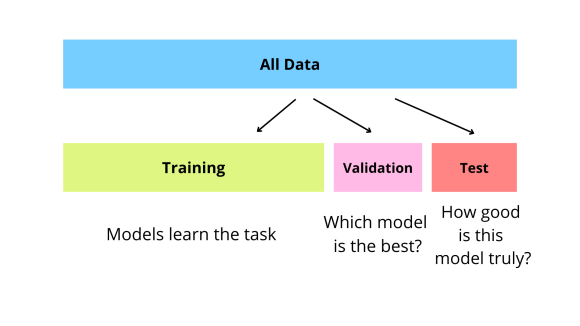
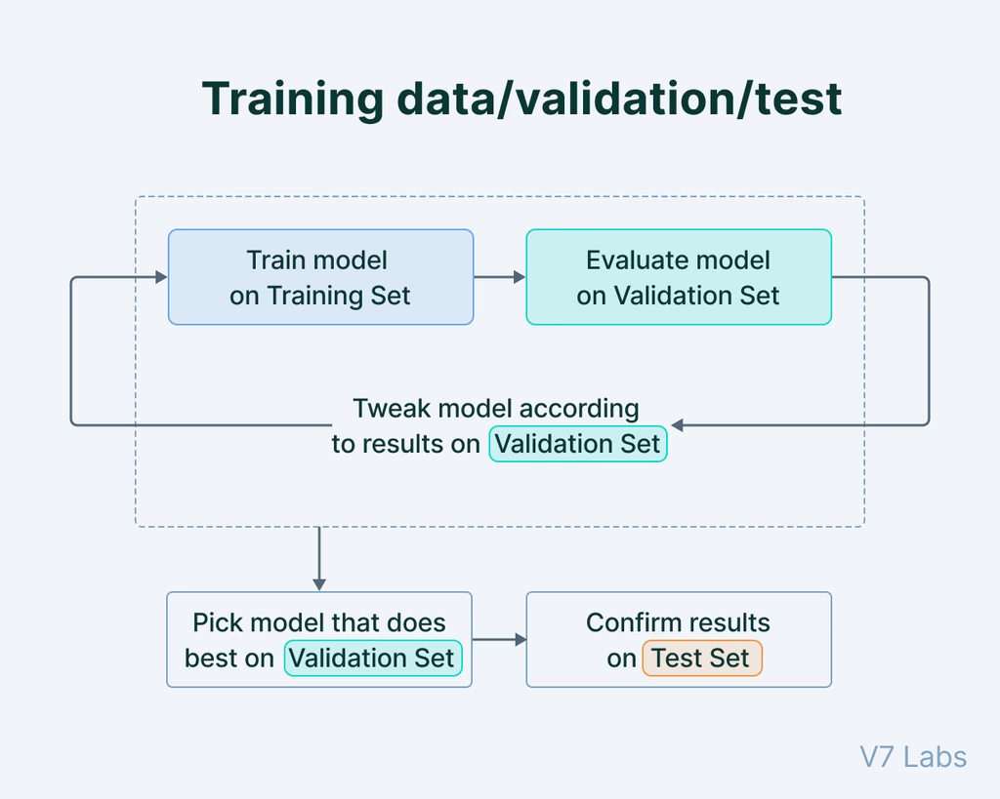

In [8]:
# fetching the training and testing data
total_training_data = fetch_20newsgroups(subset='train', categories=categories, remove=('headers', 'footers', 'quotes'), shuffle=True)
total_testing_data = fetch_20newsgroups(subset='test', categories=categories, remove=('headers', 'footers', 'quotes'),shuffle=True)

In [9]:
# viewing the number of documents in the training and testing data
print("Total training data:",len(total_training_data['data']))
print("Total testing data:",len(total_testing_data['data']))

Total training data: 9650
Total testing data: 6425


In [10]:
def count_per_class(training_data, categories):
  """
  Function to return the number of documents per class
  """
  count_list=[]
  for i in range(len(categories)):
    boolean_value=(training_data['target'] == i)
    count=0
    for i in boolean_value:
      if i==True:
        count+=1
    count_list.append(count)
  class_count = {}
  for i in range(len(count_list)):
    class_count[categories[i]]=count_list[i]
  return class_count

In [11]:
# viewing the count of documents per category
count_per_category = count_per_class(total_training_data,categories)
count_per_category

{'comp.graphics': 584,
 'comp.os.ms-windows.misc': 591,
 'comp.sys.ibm.pc.hardware': 590,
 'comp.sys.mac.hardware': 578,
 'comp.windows.x': 593,
 'rec.autos': 594,
 'rec.motorcycles': 598,
 'rec.sport.baseball': 597,
 'rec.sport.hockey': 600,
 'sci.crypt': 595,
 'sci.electronics': 591,
 'sci.med': 594,
 'sci.space': 593,
 'talk.politics.guns': 546,
 'talk.politics.mideast': 564,
 'talk.politics.misc': 465,
 'talk.religion.misc': 377}

In [20]:
# Sort the dictionary
count_per_category = dict(sorted(count_per_category.items(), key=lambda item: item[1]))
count_per_category

{'talk.religion.misc': 377,
 'talk.politics.misc': 465,
 'talk.politics.guns': 546,
 'talk.politics.mideast': 564,
 'comp.sys.mac.hardware': 578,
 'comp.graphics': 584,
 'comp.sys.ibm.pc.hardware': 590,
 'comp.os.ms-windows.misc': 591,
 'sci.electronics': 591,
 'comp.windows.x': 593,
 'sci.space': 593,
 'rec.autos': 594,
 'sci.med': 594,
 'sci.crypt': 595,
 'rec.sport.baseball': 597,
 'rec.motorcycles': 598,
 'rec.sport.hockey': 600}

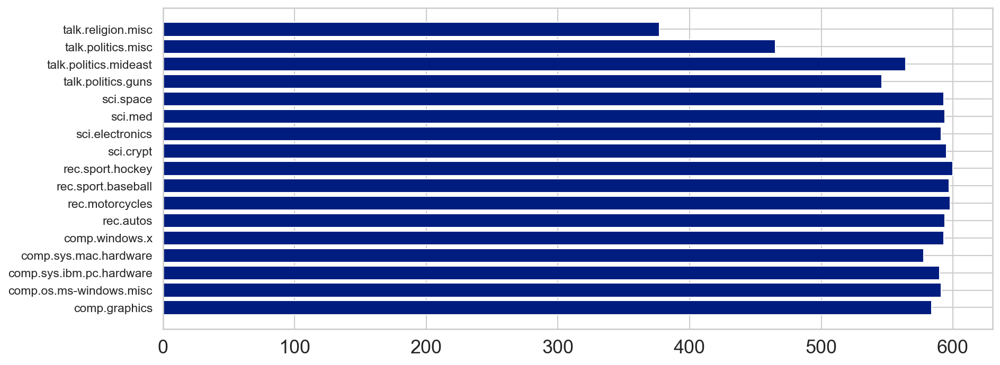

In [12]:
# plotting the count of documents per category
plt.figure(figsize=(12, 5))
category = list(count_per_category.keys())
count = list(count_per_category.values())
plt.barh(range(len(count_per_category)), count, tick_label=category)
plt.show()

### ✏️ Observe the results above and discuss the following:
- What are the majority classes? What are the minority classes?
- How does the imbalanced nature of class distribution affect the classification results?

Answer:
1. Question One
    - The majority classes are:
    count_per_category
        - 'comp.sys.mac.hardware': 578,
        - 'comp.graphics': 584,
        - 'comp.sys.ibm.pc.hardware': 590,
        - 'comp.os.ms-windows.misc': 591,
        - 'sci.electronics': 591,
        - 'comp.windows.x': 593,
        - 'sci.space': 593,
        - 'rec.autos': 594,
        - 'sci.med': 594,
        - 'sci.crypt': 595,
        - 'rec.sport.baseball': 597,
        - 'rec.motorcycles': 598,
        - 'rec.sport.hockey': 600
    - The minority classes are:
        - 'talk.religion.misc': 377,
        - 'talk.politics.misc': 465,
        - 'talk.politics.guns': 546,
        - 'talk.politics.mideast': 564,

2. Question Two
    - There might be low performance on the minority classes because the model is biased towards the majority classes. The mostly effect by the lack of the data in the minority classes. So the model will not be able to learn the patterns in the minority classes well.

In [13]:
# accesing the features and target
X_train_data = pd.DataFrame(total_training_data['data'], columns=["post"])
y_train = pd.DataFrame(total_training_data['target'])
X_test_data = pd.DataFrame(total_testing_data['data'], columns=["post"])
y_test = pd.DataFrame(total_testing_data['target'])

In [14]:
# viewing the training data
X_train_data

,post
0,\n\nThere were many injustices in the middle a...
1,\n\nThis actually supports Bill's speculation ...
2,\nApplied Engineering makes a NuBus card calle...
3,Mark McWiggins <markmc@halcyon.com> reminds us...
4,"\nExcellently put!\n\nEven as a libertarian, I..."
...,...
9645,\nAll Toyotas have airbags with a real horn. C...
9646,HELP!\nMaybe anybody know names of conferenc...
9647,\nI'm not aware that the US government conside...
9648,"\n Nut or not, he was clearly a liar. He sai..."


In [15]:
# viewing the testing data
y_test

,0
0,10
1,12
2,4
3,13
4,2
...,...
6420,0
6421,12
6422,2
6423,15


### 1.2.2 Data Preprocessing

In [16]:
def preprocess_post(post):
  """
  Function to preprocess the post which involves removing URL,
  removing special characters, numbers, extra spaces, etc
  """
  post = re.sub(r'\S*https?:\S*', '', post)
  post = re.sub('[^A-Za-z]+', ' ', post)

  altered_post_words = []
  for word in post.split():
    if word.lower() not in stopwords.words("english"):
      altered_post_words.append(word)
  
  post = ' '.join(altered_post_words)

  post = post.lower()

  post = post.strip()

  return post

In [17]:
# viewing the newly added feature i.e. preprocessed_post from the training data
X_train_data

,post
0,\n\nThere were many injustices in the middle a...
1,\n\nThis actually supports Bill's speculation ...
2,\nApplied Engineering makes a NuBus card calle...
3,Mark McWiggins <markmc@halcyon.com> reminds us...
4,"\nExcellently put!\n\nEven as a libertarian, I..."
...,...
9645,\nAll Toyotas have airbags with a real horn. C...
9646,HELP!\nMaybe anybody know names of conferenc...
9647,\nI'm not aware that the US government conside...
9648,"\n Nut or not, he was clearly a liar. He sai..."


In [22]:
from tqdm import tqdm

# Initialize tqdm for pandas
tqdm.pandas()
# creating a new column that has preprocessed posts with progress bar

X_train_data['preprocessed_post'] = X_train_data['post'].progress_apply(lambda x: preprocess_post(x))
X_test_data['preprocessed_post'] = X_test_data['post'].progress_apply(lambda x: preprocess_post(x))

100%|██████████| 6425/6425 [02:58<00:00, 35.92it/s]


In [23]:
X_train_data[:5]

,post,preprocessed_post
0,\n\nThere were many injustices in the middle a...,many injustices middle ages truely sad would h...
1,\n\nThis actually supports Bill's speculation ...,actually supports bill speculation backdoor rs...
2,\nApplied Engineering makes a NuBus card calle...,applied engineering makes nubus card called qu...
3,Mark McWiggins <markmc@halcyon.com> reminds us...,mark mcwiggins markmc halcyon com reminds us m...
4,"\nExcellently put!\n\nEven as a libertarian, I...",excellently put even libertarian admit governm...


In [24]:
X_test_data[:5]

,post,preprocessed_post
0,I have a question about accessing certain addr...,question accessing certain addresses chip part...
1,What are those other objects? UFOs????\n,objects ufos
2,\nYou have to do the same sorts of things that...,sorts things xt main loop rig timer queue put ...
3,\nAssuming the fire was caused by lanterns and...,assuming fire caused lanterns stoves knocked t...
4,: Just curious why floptical drives never seem...,curious floptical drives never seemed catch re...


## 1.3 Vectorization

### 1.3.1 TF-IDF

In [25]:
# initialize the vectorizer for word importance
vectorizer = TfidfVectorizer(min_df=5, max_df=0.95)

# applying the vectorizer to the preprocessed posts
X_train_tfidf = vectorizer.fit_transform(X_train_data['preprocessed_post'])
X_test_tfidf = vectorizer.transform(X_test_data['preprocessed_post'])

In [26]:
# viewing the sparse matrix representation of the features in the training data
X_train_tfidf.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### ✏️ Observe the results above and discuss the following:
- What are the parameters that we can set for the TfidfVectorizer?
- How can we find the best parameter setting?

Answer:
Answer:
1. Question One
   - There are several parameters are important for the TfidfVectorizer:
        - max_df: When building the vocabulary ignore terms that have a document frequency strictly higher than the given threshold.
        - min_df: When building the vocabulary ignore terms that have a document frequency strictly lower than the given threshold.
        - ngram_range: The lower and upper boundary of the range of n-values for different n-grams to be extracted. This can make not only unigrams but also bigrams, trigrams, etc. Sometime multiple words can give better insights.
        - stop_words: If a string, it is passed to _check_stop_list and the appropriate stop list is returned. ‘english’ is currently the only supported string value. This is really great for focusing on the important words.
        - max_features: If not None, build a vocabulary that only consider the top max_features ordered by term frequency across the corpus. This can be used to limit the number of features extracted.
        - norm: If True, the output is normalized. This is really useful for getting the importance of the words.
        - use_idf: Enable inverse-document-frequency reweighting. It can be disabled if for only term frequency is needed.
        - smooth_idf: Smooth idf weights by adding one to document frequencies, as if an extra document was seen containing every term in the collection exactly once. Prevents zero divisions.
        - sublinear_tf: Apply sublinear tf scaling, i.e., replace tf with 1 + log(tf).
2. Question Two
    - In most case in Hyperparameter tuning, it can be done by using GridSearchCV. This is by search for the best parameters for the model. There also can be done by manually observation of the results. Like much better stop words, ngram_range might be helpful.


### 1.3.2 Word2Vec

In [27]:
tokenized_documents = [word_tokenize(doc) for doc in X_train_data['preprocessed_post']]

# Train Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_documents, vector_size=128, window=5, min_count=2, workers=10)

In [28]:
# Compute document embeddings by averaging word vectors
def document_embedding(doc):
    vectors = [word2vec_model.wv[word] for word in word_tokenize(doc) if word in word2vec_model.wv]
    if vectors:  # Avoid empty lists
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(word2vec_model.vector_size)  # Default zero vector for empty documents

# applying the vectorizer to the preprocessed posts
X_train_w2v = [document_embedding(doc) for doc in X_train_data['preprocessed_post']]
X_test_w2v = [document_embedding(doc) for doc in X_test_data['preprocessed_post']]

In [29]:
np.array(X_train_w2v)

array([[-0.1748465 , -0.10813931,  0.52465916, ..., -0.2009832 ,
        -0.18136777,  0.02623142],
       [-0.41686526, -0.10485935,  0.46460506, ..., -0.29191229,
        -0.06774985, -0.07452962],
       [-0.30933139, -0.14843632,  0.33853936, ..., -0.37171683,
         0.12447885,  0.0085918 ],
       ...,
       [-0.3703545 ,  0.03592933,  0.47348812, ..., -0.20662791,
        -0.31160843,  0.06498319],
       [-0.1062087 , -0.08284895,  0.45403236, ..., -0.27683428,
        -0.11383954,  0.04231742],
       [-0.25690314, -0.01768879,  0.44241408, ..., -0.68518436,
        -0.04454681, -0.0455668 ]])

# 2. Classification

In [30]:
# defining the classification models
classification_models = ['K Nearest Neighbor', 'K Nearest Neighbor Hypertuned', 'Support Vector Machine', 'Support Vector Machine Hypertuned', 'Multinomial Naive Bayes', 'Multinomial Naive Bayes Hypertuned', 'Logistic Regression Multiclass', 'Logistic Regression One-vs-all']

In [31]:
# initializing lists to track the training and testing accuracies
all_category_train_accuracy = []
all_category_test_accuracy = []

In [32]:
# initializing lists to track performance metrics
all_precision_score = []
all_recall_score = []
all_f1_score = []

**Use TF-IDF as document features**

In [33]:
X_train = X_train_tfidf
X_test = X_test_tfidf
# X_train = X_train_w2v
# X_test = X_test_w2v

## 2.1 K-Nearest Neighbour Classifier


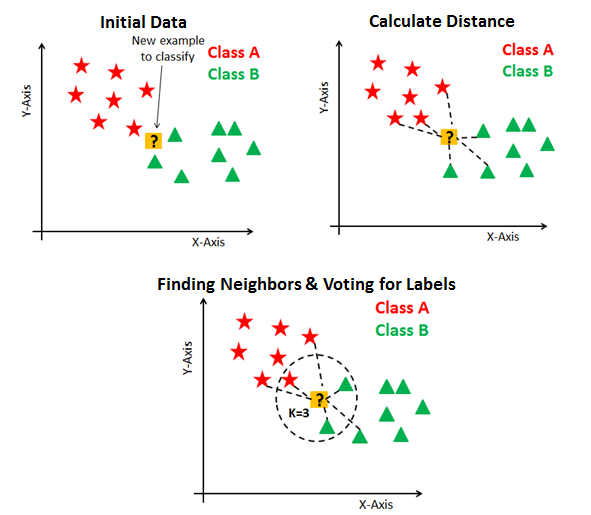

### 2.1.1 Training

In [34]:
# initializing and fitting the KNN Classifier
all_knn_clf = KNeighborsClassifier(n_neighbors=4)
all_knn_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=4)

### ✏️ Observe the results above and discuss the following:
- What does the parameter n_neighbors do?

Answer:
- The parameter n_neighbors is the number of neighbors to use by default for k neighbors queries. Well, this is the most important parameter in KNN. The data point will look at the n_neighbors nearest data points to determine the class of the data point should belong to.

### 2.1.2 Evaluation

In [35]:
# calculating training accuracy
all_knn_train_prediction = all_knn_clf.predict(X_train)
all_knn_train_accuracy = accuracy_score(y_train,all_knn_train_prediction)
print("Training Accuracy:", all_knn_train_accuracy*100)
all_category_train_accuracy.append(all_knn_train_accuracy)

# calculating testing accuracy
all_knn_test_prediction = all_knn_clf.predict(X_test)
all_knn_test_accuracy = accuracy_score(y_test, all_knn_test_prediction)
print("Testing Accuracy:", all_knn_test_accuracy*100)
all_category_test_accuracy.append(all_knn_test_accuracy)

Training Accuracy: 65.84455958549222
Testing Accuracy: 10.832684824902723


**Confusion Matric (Binary Class)**

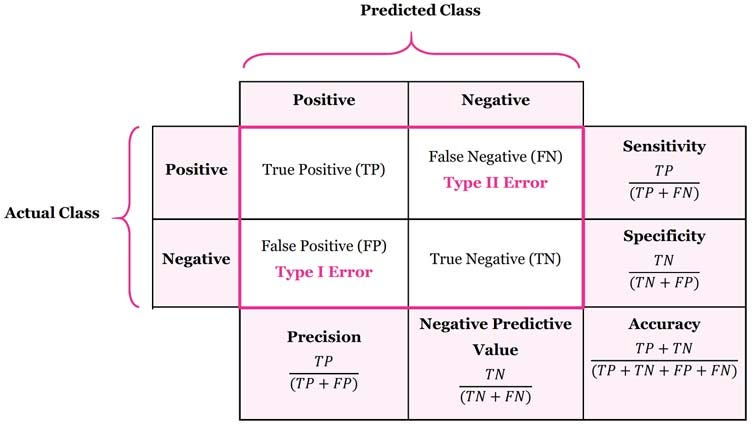

**Confusion Matric (Multi-Class)**

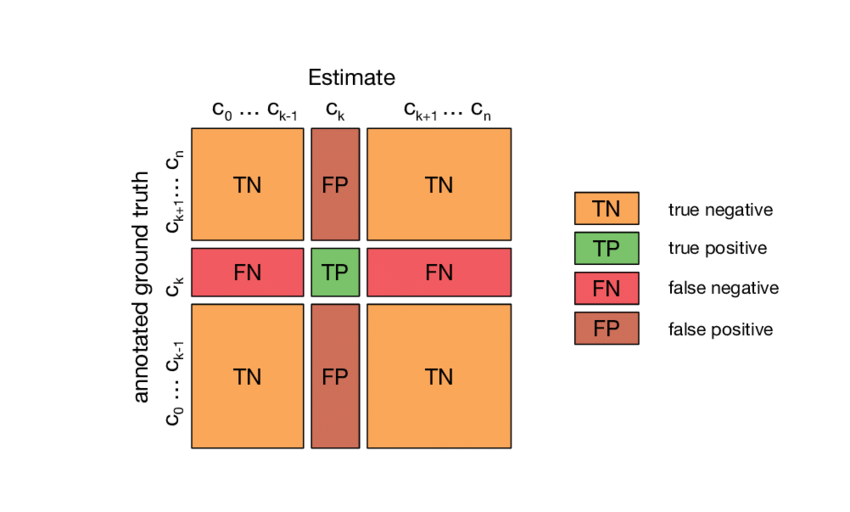

In [36]:
# creating the confusion matrix
all_knn_conf_matrix = confusion_matrix(y_test, all_knn_test_prediction)

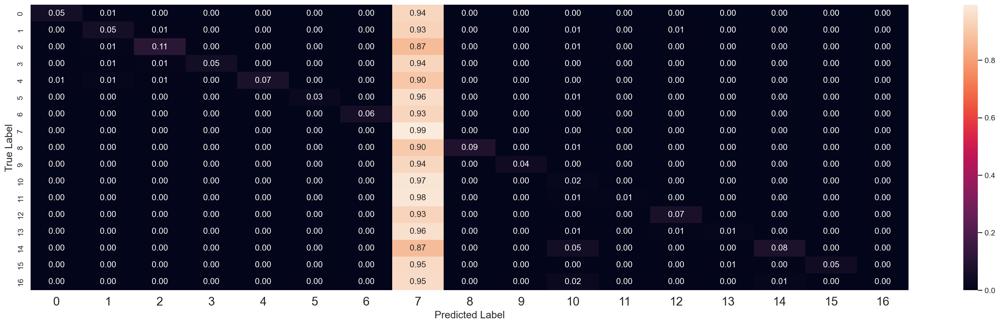

In [37]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_knn_conf_matrix_norm = all_knn_conf_matrix.astype('float') / all_knn_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_knn_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [38]:
# calculating metrics for the prediction
all_knn_metrics = metrics.classification_report(y_test, all_knn_test_prediction,target_names=categories)
print(all_knn_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.83      0.05      0.10       389
 comp.os.ms-windows.misc       0.56      0.05      0.09       394
comp.sys.ibm.pc.hardware       0.80      0.11      0.20       392
   comp.sys.mac.hardware       0.86      0.05      0.09       385
          comp.windows.x       0.94      0.07      0.14       395
               rec.autos       0.85      0.03      0.05       396
         rec.motorcycles       0.80      0.06      0.11       398
      rec.sport.baseball       0.07      0.99      0.12       397
        rec.sport.hockey       0.97      0.09      0.16       399
               sci.crypt       0.84      0.04      0.08       396
         sci.electronics       0.14      0.02      0.03       393
                 sci.med       1.00      0.01      0.02       396
               sci.space       0.77      0.07      0.13       394
      talk.politics.guns       0.62      0.01      0.03       364
   talk.p

### ✏️ Observe the results above and discuss the following:
- Is these good results? Why?
- What is the difference between Macro avg and Weighted avg?

Answer:
1. Question One
    - Well in this case, the testing result show it dropped Accuracy for a lot. Which shows the model is overfitting. The result is show the model is still having some improvement to do. For a better model, the testing accuracy should be similar to the training accuracy. From the F1 score, it only archived 0.09 which is too low.
2. Question Two
    - Macro avg: Calculate metrics for each label, and find their unweighted means. This does not take class imbalance into account.
    - Weighted avg: Calculate metrics for each label, and find their average weighted by support. This mainly helps to balance the lack of data in the minority classes.

### 2.1.3 Hyperparameters Tuning

**Grid Search**

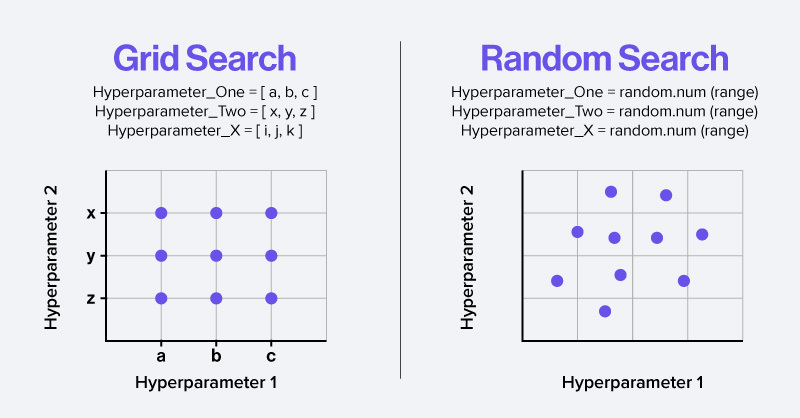

**Cross-Validation**
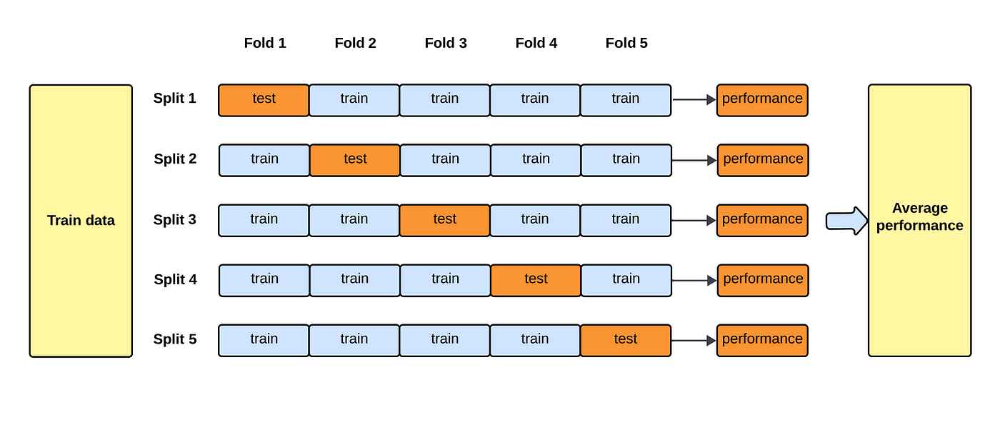

#### 2.1.3.1 Grid Search Cross Validation

In [39]:
# initializing grid search cross validation for hyperparameter tuning
neighbour_values=[i for i in range(1, 15)]
weight_values=['uniform', 'distance']
leaf_values = [30,40,50,60]

all_knn_parameters_dict = dict(n_neighbors=neighbour_values, weights=weight_values,leaf_size=leaf_values)
all_knn_grid = GridSearchCV(all_knn_clf, all_knn_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
all_knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=4), n_jobs=10,
             param_grid={'leaf_size': [30, 40, 50, 60],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [40]:
# viewing the best parameters
print(all_knn_grid.best_params_)

{'leaf_size': 30, 'n_neighbors': 1, 'weights': 'uniform'}


#### 2.1.3.2 Retraining

In [41]:
# reinitializing and refitting the KNN Classifier
all_knn_ht_clf = KNeighborsClassifier(n_neighbors=1,weights='uniform',leaf_size=30)
all_knn_ht_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

#### 2.1.3.3 Re-evaluation

In [42]:
# recalculating training accuracy
all_knn_ht_train_prediction = all_knn_ht_clf.predict(X_train)
all_knn_ht_train_accuracy = accuracy_score(y_train,all_knn_ht_train_prediction)
print("Training Accuracy with tuned Hyperparameters:",all_knn_ht_train_accuracy*100)
all_category_train_accuracy.append(all_knn_ht_train_accuracy)

# recalculating testing accuracy
all_knn_ht_test_prediction = all_knn_ht_clf.predict(X_test)
all_knn_ht_test_accuracy = accuracy_score(y_test, all_knn_ht_test_prediction)
print("Testing Accuracy with tuned Hyperparameters:",all_knn_ht_test_accuracy*100)
all_category_test_accuracy.append(all_knn_ht_test_accuracy)

Training Accuracy with tuned Hyperparameters: 97.139896373057
Testing Accuracy with tuned Hyperparameters: 12.01556420233463


In [43]:
# creating the confusion matrix
all_knn_ht_conf_matrix = confusion_matrix(y_test, all_knn_ht_test_prediction)

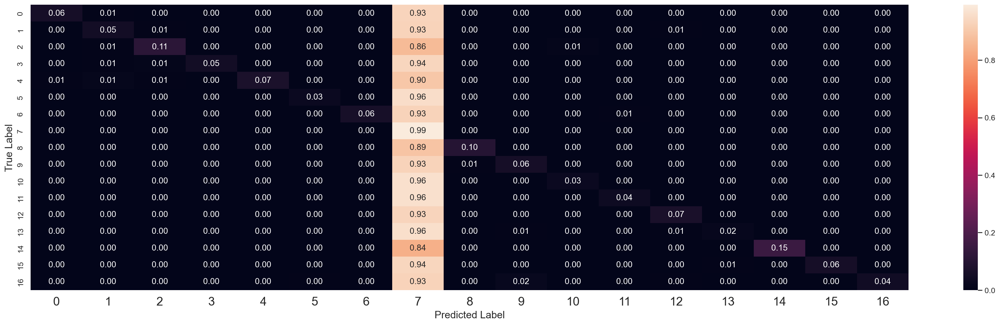

In [44]:
# renormalising and reviewing the confusion matrix
plt.clf() # clear previous diagrams
all_knn_ht_conf_matrix_norm = all_knn_ht_conf_matrix.astype('float') / all_knn_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_knn_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [45]:
# calculating metrics for the prediction
all_knn_ht_metrics = metrics.classification_report(y_test, all_knn_ht_test_prediction,target_names=categories)
print(all_knn_ht_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.85      0.06      0.11       389
 comp.os.ms-windows.misc       0.56      0.05      0.09       394
comp.sys.ibm.pc.hardware       0.82      0.11      0.20       392
   comp.sys.mac.hardware       0.90      0.05      0.09       385
          comp.windows.x       0.91      0.07      0.14       395
               rec.autos       0.85      0.03      0.05       396
         rec.motorcycles       0.77      0.06      0.11       398
      rec.sport.baseball       0.07      0.99      0.12       397
        rec.sport.hockey       0.95      0.10      0.18       399
               sci.crypt       0.71      0.06      0.10       396
         sci.electronics       0.58      0.03      0.05       393
                 sci.med       0.79      0.04      0.07       396
               sci.space       0.84      0.07      0.13       394
      talk.politics.guns       0.64      0.02      0.04       364
   talk.p

### ✏️ Observe the results above and discuss the following:
- Has the performance imporved? Try to interpret the results.

Answer:
- The performance is slightly improved. The testing F1 score is increased to 0.12 (Weighted avg). This shows out that the hyperparameter tuning can be further improved the model. Which find a balance for suit in the task.

## 2.2 Support Vector Machine Classifier

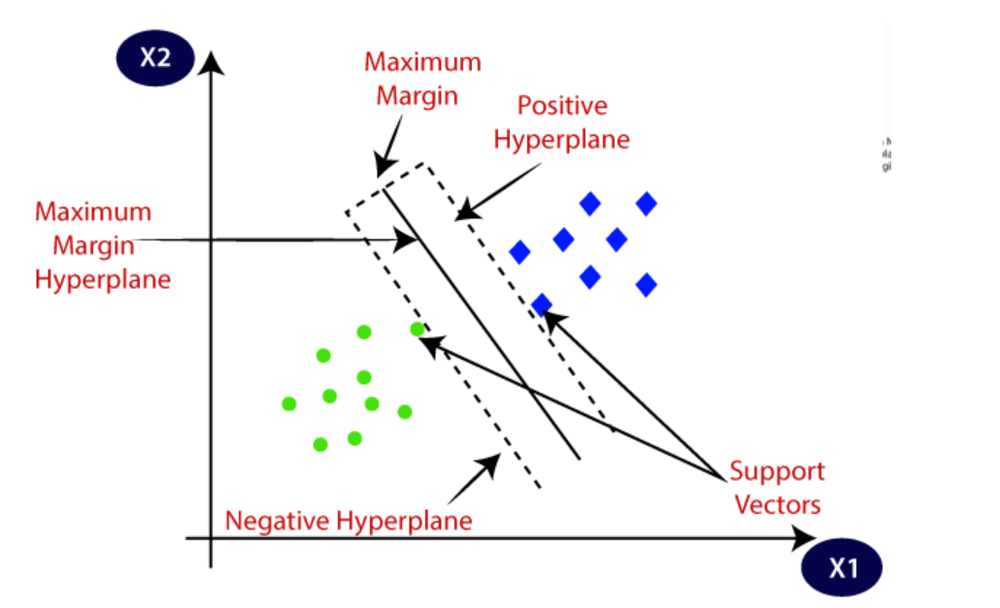
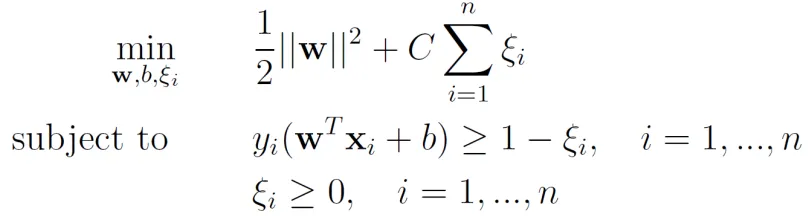

**The Parameters**
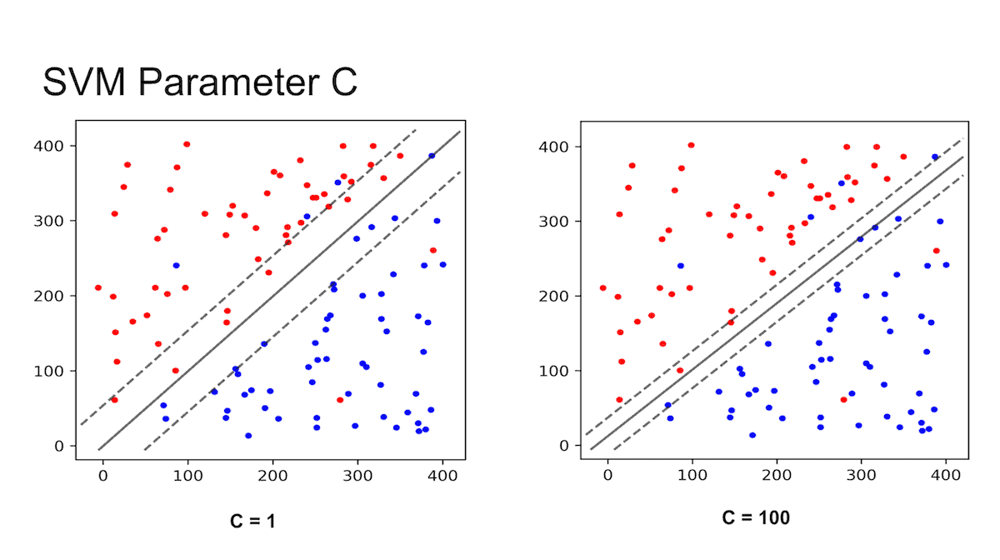

**Multi-Class Classification Setting**
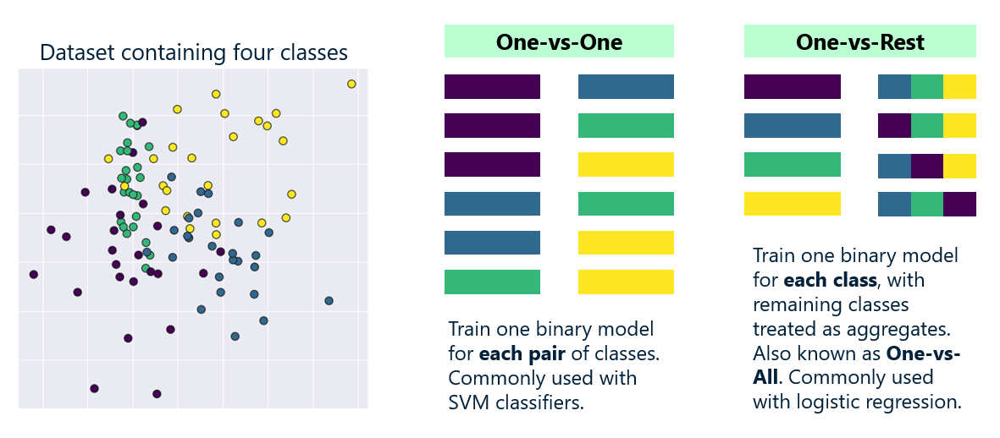

### 2.2.1 Training

In [46]:
# initializing and fitting the SVM classifier
all_svm_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000)
all_svm_clf.fit(X_train,y_train)

LinearSVC(dual=False)

### 2.2.2 Evaluation

In [47]:
# calculating training accuracy
all_svm_train_prediction = all_svm_clf.predict(X_train)
all_svm_train_accuracy = accuracy_score(y_train,all_svm_train_prediction)
print("Training Accuracy:",all_svm_train_accuracy*100)
all_category_train_accuracy.append(all_svm_train_accuracy)

# calculating testing accuracy
all_svm_test_prediction = all_svm_clf.predict(X_test)
all_svm_test_accuracy = accuracy_score(y_test, all_svm_test_prediction)
print("Testing Accuracy:",all_svm_test_accuracy*100)
all_category_test_accuracy.append(all_svm_test_accuracy)

Training Accuracy: 96.9119170984456
Testing Accuracy: 69.89883268482491


In [48]:
# creating the confusion matrix
all_svm_conf_matrix = confusion_matrix(y_test, all_svm_test_prediction)

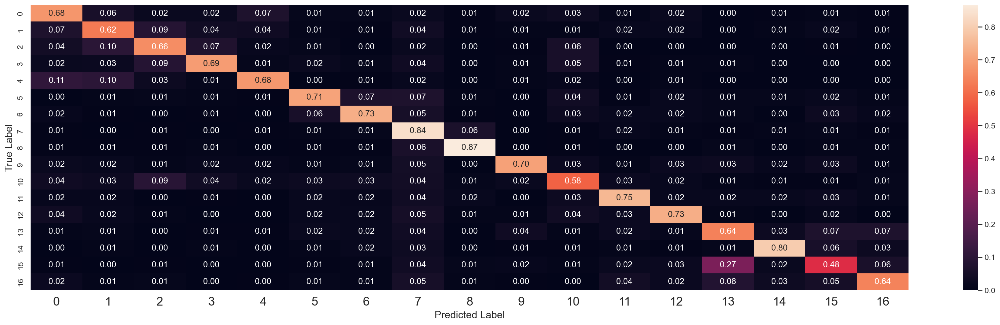

In [49]:
# normalizing and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_svm_conf_matrix_norm = all_svm_conf_matrix.astype('float') / all_svm_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_svm_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [50]:
# calculating metrics for the prediction
all_svm_metrics = metrics.classification_report(y_test, all_svm_test_prediction,target_names=categories)
print(all_svm_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.62      0.68      0.65       389
 comp.os.ms-windows.misc       0.61      0.62      0.62       394
comp.sys.ibm.pc.hardware       0.64      0.66      0.65       392
   comp.sys.mac.hardware       0.74      0.69      0.71       385
          comp.windows.x       0.77      0.68      0.72       395
               rec.autos       0.75      0.71      0.73       396
         rec.motorcycles       0.75      0.73      0.74       398
      rec.sport.baseball       0.58      0.84      0.68       397
        rec.sport.hockey       0.86      0.87      0.86       399
               sci.crypt       0.83      0.70      0.76       396
         sci.electronics       0.62      0.58      0.60       393
                 sci.med       0.78      0.75      0.76       396
               sci.space       0.77      0.73      0.75       394
      talk.politics.guns       0.59      0.64      0.62       364
   talk.p

### ✏️ Observe the results above and discuss the following:
- Obviously, SVM is a very powerful classifier, so let's dive deeper into this model. The SVM classifier we use here utilizes a soft margin. What is a hard margin, and what is a soft margin in SVM?
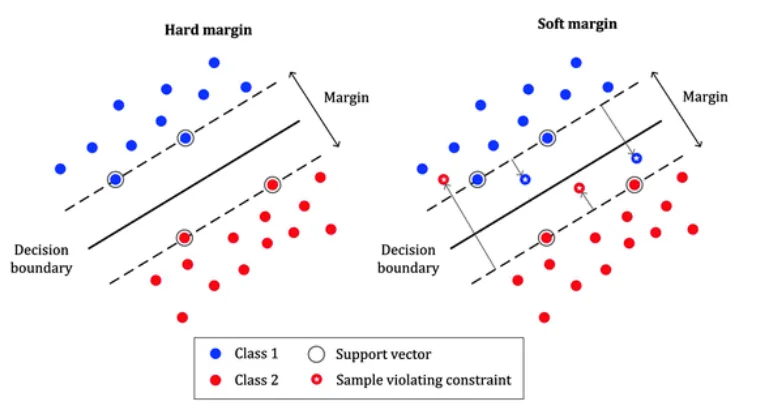
- What categories is SVM good at classifying? How about those SVM performs poorly on?

Answer:
- Question One
    - Hard margin: A hard margin is a type of SVM that does not allow any mis-classification. It is used when the data is linearly separable and noise-free. It is very sensitive to outliers and noise.
    - Soft margin: A soft margin is a type of SVM that allows some mis-classification. It is used when the data is not linearly separable and contains noise. It is more robust to outliers and noise. Because in most cases, the data is not linearly separable or might have outliers, the soft margin can be used to reduce the possibility of overfitting.
- Question Two
    -  From the result, the SVM is generally good at classifying the categories of the rec.sport.hockey and talk.politics.mideast. The SVM seems poorly on talk.politics.misc on the other hand.

### 2.2.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [51]:
# intializing grid search cross validation for hyperparameter tuning
penalty_values=['l1','l2']
tolerance_values = [0.1,0.001]
C_values=[2,5,10]
all_svm_parameters_dict = dict(penalty=penalty_values, C=C_values, tol=tolerance_values)
all_svm_grid = GridSearchCV(all_svm_clf, all_svm_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
all_svm_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False), n_jobs=10,
             param_grid={'C': [2, 5, 10], 'penalty': ['l1', 'l2'],
                         'tol': [0.1, 0.001]},
             scoring='accuracy')

In [52]:
# viewing the best parameters
print(all_svm_grid.best_params_)

{'C': 2, 'penalty': 'l2', 'tol': 0.1}


##### **Retraining**

In [53]:
# reinitializing and refitting the SVM classifier
all_svm_ht_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000, C=2, tol=0.1)
all_svm_ht_clf.fit(X_train,y_train)

LinearSVC(C=2, dual=False, tol=0.1)

##### **Revaluation**

In [54]:
# recalculating training accuracy
all_svm_ht_train_prediction = all_svm_ht_clf.predict(X_train)
all_svm_ht_train_accuracy = accuracy_score(y_train,all_svm_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",all_svm_ht_train_accuracy*100)
all_category_train_accuracy.append(all_svm_ht_train_accuracy)

# recalculating testing accuracy
all_svm_ht_test_prediction = all_svm_ht_clf.predict(X_test)
all_svm_ht_test_accuracy = accuracy_score(y_test, all_svm_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",all_svm_ht_test_accuracy*100)
all_category_test_accuracy.append(all_svm_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 96.05181347150258
Testing Accuracy with tuned hyperparameters: 70.10116731517509


In [55]:
# creating the confusion matrix
all_svm_ht_conf_matrix = confusion_matrix(y_test, all_svm_ht_test_prediction)

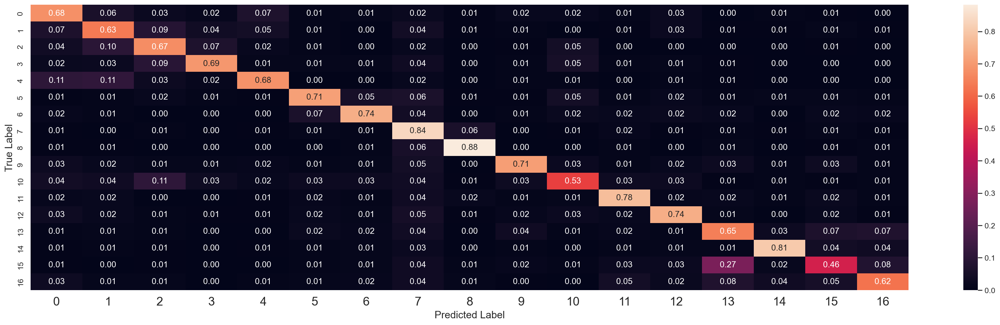

In [56]:
# renormalizing and reviewing the confusion matrix
plt.clf() # clear previous diagrams
all_svm_ht_conf_matrix_norm = all_svm_ht_conf_matrix.astype('float') / all_svm_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_svm_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [57]:
# calculating metrics for the prediction
all_svm_ht_metrics = metrics.classification_report(y_test, all_svm_ht_test_prediction, target_names=categories)
print(all_svm_ht_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.61      0.68      0.64       389
 comp.os.ms-windows.misc       0.59      0.63      0.61       394
comp.sys.ibm.pc.hardware       0.62      0.67      0.64       392
   comp.sys.mac.hardware       0.76      0.69      0.73       385
          comp.windows.x       0.76      0.68      0.72       395
               rec.autos       0.75      0.71      0.73       396
         rec.motorcycles       0.78      0.74      0.76       398
      rec.sport.baseball       0.59      0.84      0.69       397
        rec.sport.hockey       0.87      0.88      0.88       399
               sci.crypt       0.80      0.71      0.75       396
         sci.electronics       0.65      0.53      0.58       393
                 sci.med       0.79      0.78      0.78       396
               sci.space       0.76      0.74      0.75       394
      talk.politics.guns       0.59      0.65      0.62       364
   talk.p

## 2.3 Multinomial Naive Bayes Classifier

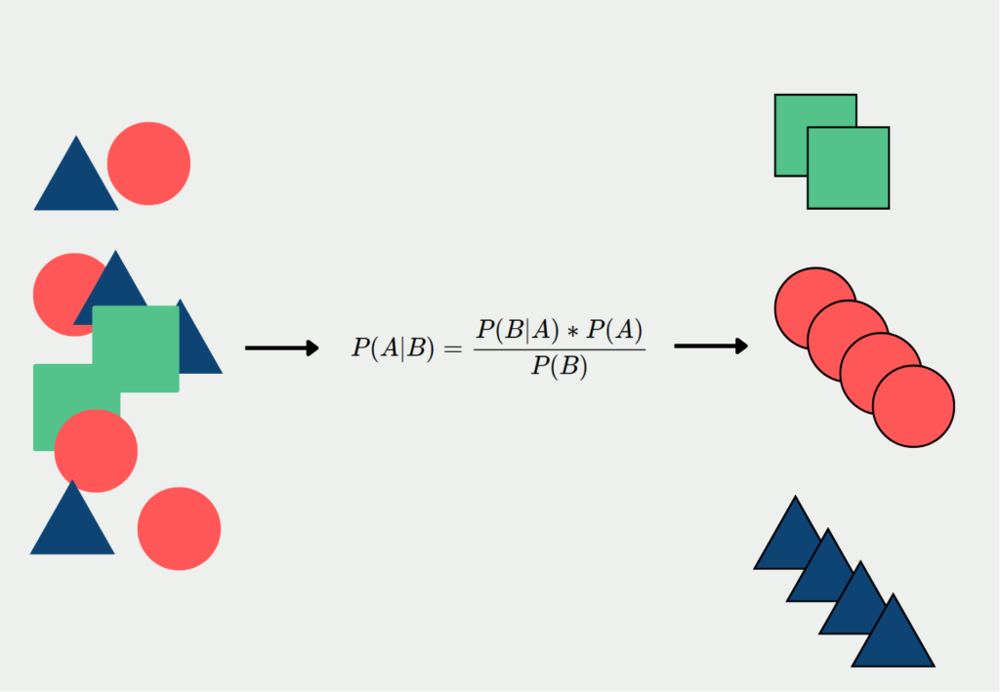
**The classification problem: find $p(class|doc)$**
$$p(class|doc)=\frac{p(doc|class)\cdot p(class)}{p(doc)}$$

**Estimation of $p(class|doc)$**

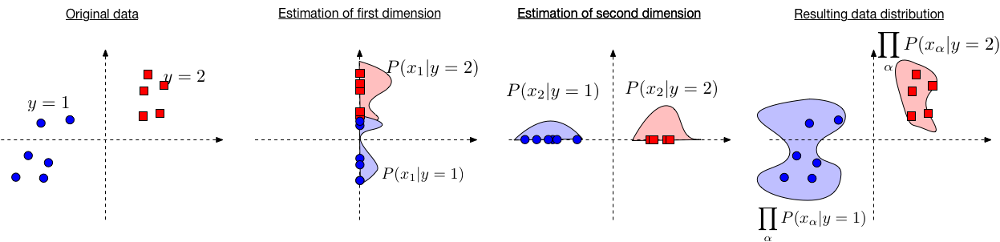


📖 [A very good explanation to Bayes Classifers](https://www.cs.cornell.edu/courses/cs4780/2022fa/lectures/lecturenote05.html)

### 2.3.1 Training

In [58]:
# initializing and fitting the Multinomial Naive Bayes Classifier
all_mnb_clf = MultinomialNB(alpha=0.1)
all_mnb_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.1)

### ✏️ Observe the results above and discuss the following:
- What does the parameter alpha control?

Answer:
- The parameter alpha is the Additive (Laplace/ Lidstone) smoothing parameter. This means each feature count will have a small value of alpha added to it. This will help to avoid the zero probabilities. When a probability is zero, it will lead to issue in multiplication. To avoid this issue, the alpha is used to smooth the data.

### 2.3.2 Evaluation

In [59]:
# calculating training accuracy
all_mnb_train_prediction = all_mnb_clf.predict(X_train)
all_mnb_train_accuracy = accuracy_score(y_train, all_mnb_train_prediction)
print("Training Accuracy:",all_mnb_train_accuracy*100)
all_category_train_accuracy.append(all_mnb_train_accuracy)

# calculating the testing accuracy 
all_mnb_test_prediction = all_mnb_clf.predict(X_test)
all_mnb_test_accuracy= accuracy_score(y_test, all_mnb_test_prediction)
print("Testing Accuracy:",all_mnb_test_accuracy*100)
all_category_test_accuracy.append(all_mnb_test_accuracy)

Training Accuracy: 93.17098445595855
Testing Accuracy: 71.56420233463035


In [60]:
# creating the confusion matrix
all_mnb_conf_matrix = confusion_matrix(y_test, all_mnb_test_prediction)

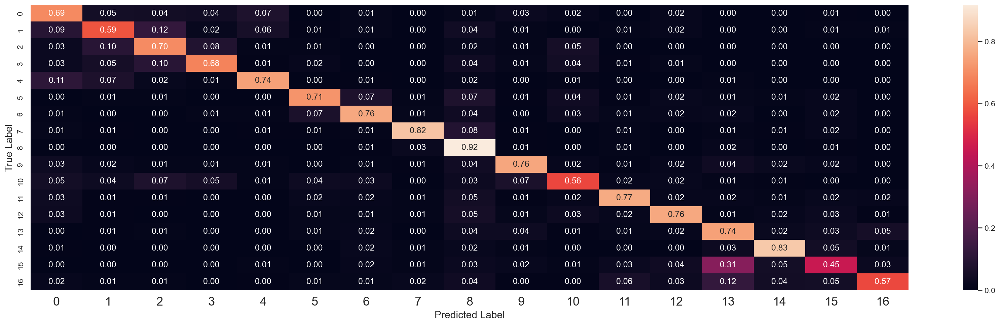

In [61]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_mnb_conf_matrix_norm = all_mnb_conf_matrix.astype('float') / all_mnb_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_mnb_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [62]:
# calculating metrics for the prediction
all_mnb_metrics = metrics.classification_report(y_test, all_mnb_test_prediction,target_names=categories)
print(all_mnb_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.61      0.69      0.65       389
 comp.os.ms-windows.misc       0.62      0.59      0.60       394
comp.sys.ibm.pc.hardware       0.63      0.70      0.66       392
   comp.sys.mac.hardware       0.74      0.68      0.71       385
          comp.windows.x       0.79      0.74      0.77       395
               rec.autos       0.79      0.71      0.75       396
         rec.motorcycles       0.76      0.76      0.76       398
      rec.sport.baseball       0.89      0.82      0.85       397
        rec.sport.hockey       0.61      0.92      0.73       399
               sci.crypt       0.78      0.76      0.77       396
         sci.electronics       0.67      0.56      0.61       393
                 sci.med       0.82      0.77      0.79       396
               sci.space       0.78      0.76      0.77       394
      talk.politics.guns       0.58      0.74      0.65       364
   talk.p

### 2.2.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [63]:
# initializing Grid Search Cross Validation for hyperparameter tuning
alpha_range = [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5, 8, 9, 10]
fit_vals=[True,False]
all_mnb_parameters_dict = dict(alpha=alpha_range,fit_prior=fit_vals)
all_mnb_grid = GridSearchCV(all_mnb_clf, all_mnb_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
all_mnb_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(alpha=0.1), n_jobs=10,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5,
                                   8, 9, 10],
                         'fit_prior': [True, False]},
             scoring='accuracy')

In [64]:
# viewing the best parameters
all_mnb_grid.best_params_

{'alpha': 0.2, 'fit_prior': False}

##### **Retraining**

In [65]:
# reinitializing and refitting the Multinomial Naive Bayes Classifier
all_mnb_ht_clf = MultinomialNB(alpha=0.2,fit_prior=False)
all_mnb_ht_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.2, fit_prior=False)

##### **Revaluation**

In [66]:
# recalculating training accuracy
all_mnb_ht_train_prediction = all_mnb_ht_clf.predict(X_train)
all_mnb_ht_train_accuracy = accuracy_score(y_train, all_mnb_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",all_mnb_ht_train_accuracy*100)
all_category_train_accuracy.append(all_mnb_ht_train_accuracy)

# recalculating testing accuracy
all_mnb_ht_test_prediction = all_mnb_ht_clf.predict(X_test)
all_mnb_ht_test_accuracy= accuracy_score(y_test, all_mnb_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",all_mnb_ht_test_accuracy*100)
all_category_test_accuracy.append(all_mnb_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 92.42487046632124
Testing Accuracy with tuned hyperparameters: 71.73540856031128


In [67]:
# creating the confusion matrix
all_mnb_ht_conf_matrix = confusion_matrix(y_test, all_mnb_ht_test_prediction)

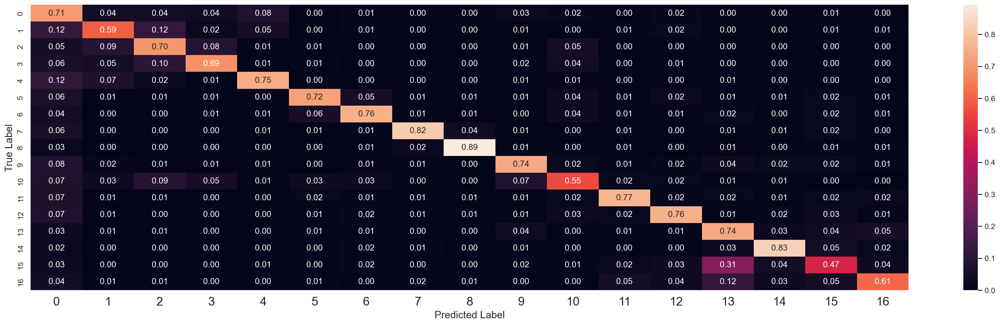

In [68]:
# renormalising and viewing the confusion matrix
all_mnb_ht_conf_matrix_norm = all_mnb_ht_conf_matrix.astype('float') / all_mnb_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_mnb_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');

In [69]:
# recalculating metrics for the prediction
all_mnb_ht_metrics = metrics.classification_report(y_test, all_mnb_ht_test_prediction,target_names=categories)
print(all_mnb_ht_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.43      0.71      0.53       389
 comp.os.ms-windows.misc       0.64      0.59      0.62       394
comp.sys.ibm.pc.hardware       0.62      0.70      0.66       392
   comp.sys.mac.hardware       0.74      0.69      0.72       385
          comp.windows.x       0.79      0.75      0.77       395
               rec.autos       0.81      0.72      0.77       396
         rec.motorcycles       0.79      0.76      0.77       398
      rec.sport.baseball       0.90      0.82      0.86       397
        rec.sport.hockey       0.91      0.89      0.90       399
               sci.crypt       0.77      0.74      0.75       396
         sci.electronics       0.67      0.55      0.61       393
                 sci.med       0.83      0.77      0.80       396
               sci.space       0.79      0.76      0.77       394
      talk.politics.guns       0.59      0.74      0.65       364
   talk.p

## 2.4 Logistic Regression

**Logistic regression is linear regression and a Sigmoid function:**
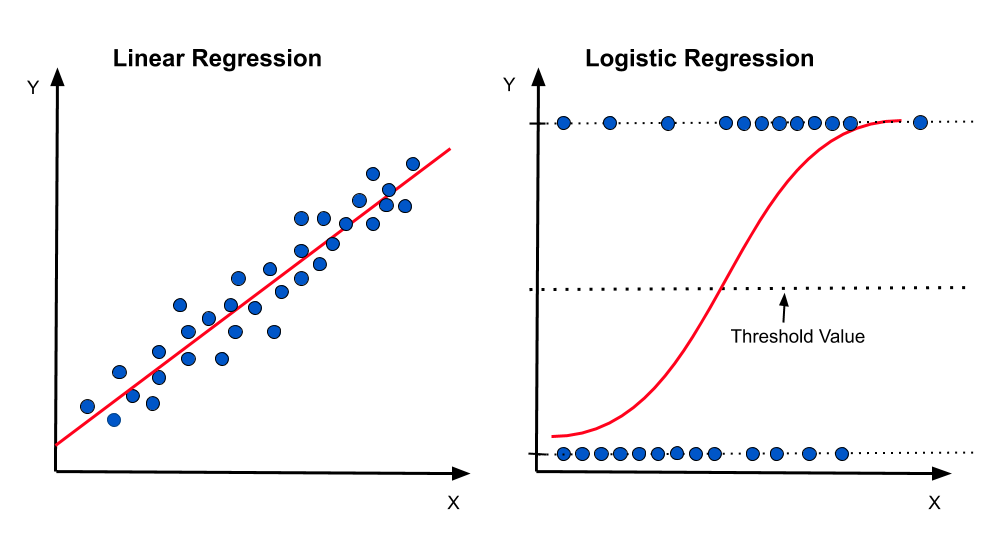

**The Sigmoid Function**

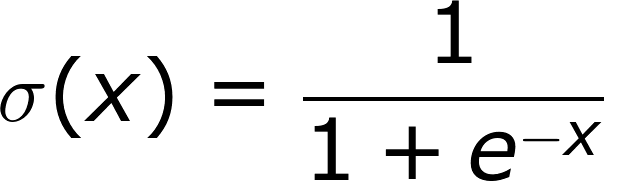

**The Logistic Regression can therefore be represented as:**

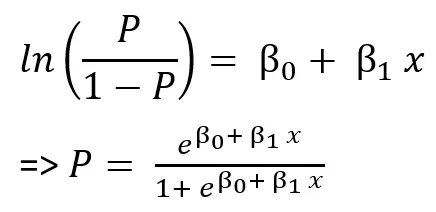

### 2.4.1 Training

In [70]:
# initializing and fitting the Logistic Regression Classifier
all_lr_clf = LogisticRegression(multi_class='multinomial', solver='lbfgs')
all_lr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial')

### 2.4.2 Evaluation

In [71]:
# calculating training accuracy
all_lr_train_prediction = all_lr_clf.predict(X_train)
all_lr_train_accuracy = accuracy_score(y_train, all_lr_train_prediction)
print("Training Accuracy:",all_lr_train_accuracy*100)
all_category_train_accuracy.append(all_lr_train_accuracy)

# calculating the testing accuracy 
all_lr_test_prediction = all_lr_clf.predict(X_test)
all_lr_test_accuracy= accuracy_score(y_test, all_lr_test_prediction)
print("Testing Accuracy:",all_lr_test_accuracy*100)
all_category_test_accuracy.append(all_lr_test_accuracy)

Training Accuracy: 91.70984455958549
Testing Accuracy: 70.58365758754864


In [72]:
# creating the confusion matrix
all_lr_conf_matrix = confusion_matrix(y_test, all_lr_test_prediction)

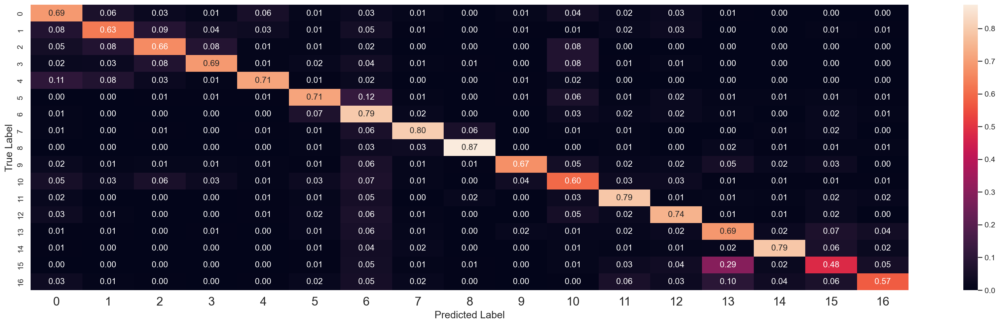

In [73]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_lr_conf_matrix_norm = all_lr_conf_matrix.astype('float') / all_lr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_lr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()

### ✏️ Observe the results above and discuss the following:
- Logistic regression is a very simple classifier. However, it already reaches decent performance. Let's use grid search to find a better parameter setting and see if we can improve the performance even further!

Answer:
- We found out that the train accuracy is hight enough while the test accuracy is lower than the train accuracy. This shows that the model is overfitting. The model is not generalized well.

## 2.5 Logistic Regression (One-vs-all)

### 2.5.1 Training

In [74]:
# initializing and fitting the Logistic Regression Classifier
all_lrovr_clf = LogisticRegression(multi_class='ovr')
all_lrovr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='ovr')

### 2.5.2 Evaluation

In [75]:
# calculating training accuracy
all_lrovr_train_prediction = all_lrovr_clf.predict(X_train)
all_lrovr_train_accuracy = accuracy_score(y_train, all_lrovr_train_prediction)
print("Training Accuracy:",all_lrovr_train_accuracy*100)
all_category_train_accuracy.append(all_lrovr_train_accuracy)

# calculating the testing accuracy 
all_lrovr_test_prediction = all_lrovr_clf.predict(X_test)
all_lrovr_test_accuracy= accuracy_score(y_test, all_lrovr_test_prediction)
print("Testing Accuracy:",all_lrovr_test_accuracy*100)
all_category_test_accuracy.append(all_lrovr_test_accuracy)

Training Accuracy: 90.65284974093264
Testing Accuracy: 70.568093385214


In [76]:
# creating the confusion matrix
all_lrovr_conf_matrix = confusion_matrix(y_test, all_lrovr_test_prediction)

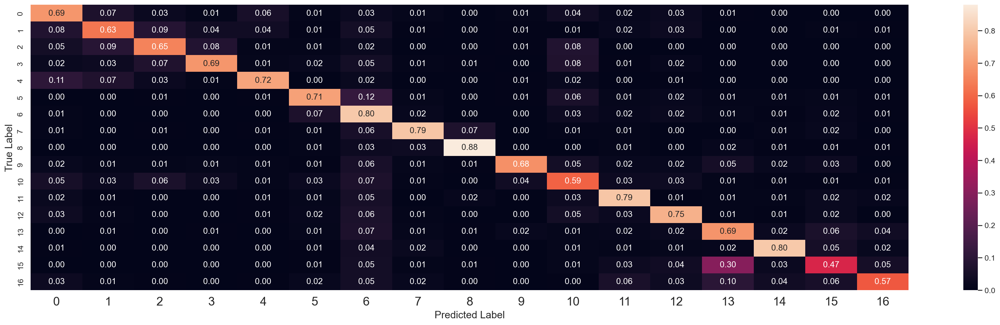

In [77]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_lrovr_conf_matrix_norm = all_lrovr_conf_matrix.astype('float') / all_lrovr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_lrovr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.show()

### ✏️ Observe the results above and discuss the following:
- Compare the performance between the two types of Logistic Regression classifier. Which one performs better in this task? Can you tell why?

Answer:
- In my observation, there is not showing a significant difference between the two types of Logistic Regression classifier. The performance is almost the same. With the first type slightly better than the second type. I think that might be some noise in One-vs-all which let each binary classifier may overfit.

## 2.6 Performance Comparision

### 2.6.1 Accuracy

In [78]:
# comparing training and testing accuracies
all_model_acc_compare = pd.DataFrame({'Algorithm' : classification_models, 'Training_Accuracy' : all_category_train_accuracy, 'Testing_Accuracy' : all_category_test_accuracy})
all_model_acc_compare.sort_values(by='Testing_Accuracy', ascending=False)

,Algorithm,Training_Accuracy,Testing_Accuracy
5,Multinomial Naive Bayes Hypertuned,0.924249,0.717354
4,Multinomial Naive Bayes,0.931710,0.715642
6,Logistic Regression Multiclass,0.917098,0.705837
7,Logistic Regression One-vs-all,0.906528,0.705681
3,Support Vector Machine Hypertuned,0.960518,0.701012
2,Support Vector Machine,0.969119,0.698988
1,K Nearest Neighbor Hypertuned,0.971399,0.120156
0,K Nearest Neighbor,0.658446,0.108327


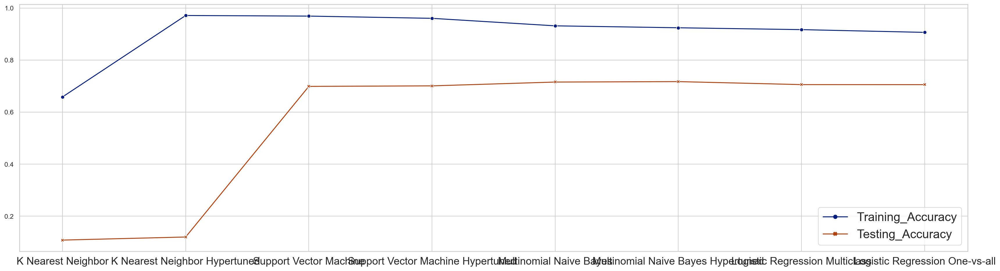

In [79]:
# visualizing the training and testing accuracies
plt.clf() # clear previous diagrams
ax = sns.lineplot(data=[all_model_acc_compare['Training_Accuracy'], all_model_acc_compare['Testing_Accuracy']], dashes=False, markers=True)
ax.set_xticks(range(len(all_model_acc_compare['Algorithm'])))
ax.set_xticklabels(all_model_acc_compare['Algorithm'])
plt.show()

### ✏️ Observe the results above and discuss the following:
- Why do you think Multinomial Naive Bayes performs well on the test set compared to other algorithms? What characteristics of this algorithm make it suitable for this dataset?
- Observe the large gap between training and testing accuracy for KNN (Hyper-tuned). What might this indicate about the model's performance? Why does hyperparameter tuning improve the testing accuracy for some algorithms (e.g., Naive Bayes) but not for others (e.g., KNN)?
- Based on the results, which algorithm would you choose for this task, and why? Consider both training and testing accuracy in your decision.
- How could you conduct error analysis to understand why certain models, such as KNN, struggle on the test set?

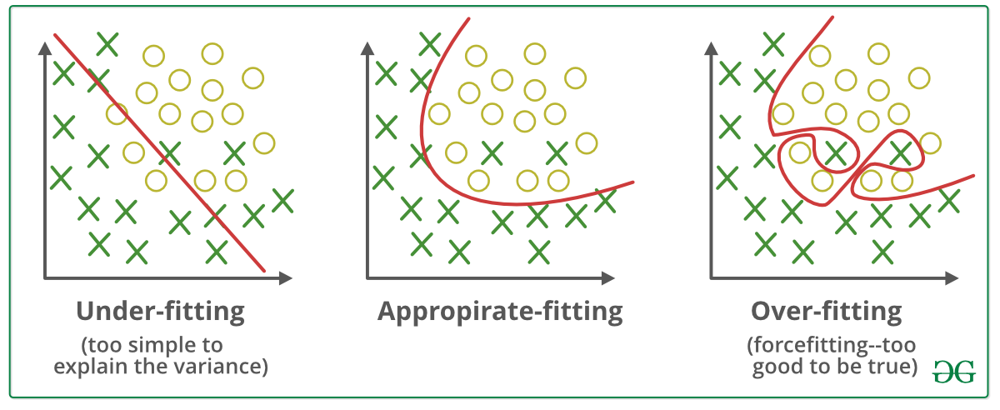

Answer:
1. Question One
    - The Multinomial Naive Bayes performs well on the test set because it use probability to classify the data. This is not vary sensitive to the noise in the data. Because common stop words are all multiplied by similar values. And the model is not too complex to overfit the data. And for the KNN, it perform pretty bad as the topic might not be not linearly separable at high dimension.
2. Question Two
    - The large gap between training and testing accuracy for KNN (Hyper-tuned) indicates that the model is overfitting. The model is not generalized well. And this also can be due to the "Curse of Dimensionality". Which a high dimension makes the Euclidean distance less useful. If further hyperparameter tuning on it, it might have a high risk of further overfitting and rely on the training data. While Naive Bayes use probability to classify the data, which is assumed that the features are independent. This can take the advantage of the hyperparameter tuning to improve the testing accuracy.
3. Question Three
    - Based on the results, I would choose the Multinomial Naive Bayes for this task with hyperparameter tuning. This is because the model has the best performance on the testing accuracy. Which indicates that the model is generalized well. And the model is not too complex to overfit the data. And the training accuracy is also high enough. The model is not underfitting at all.
4. Question Four
    - To conduct error analysis to understand why certain models, such as KNN, struggle on the test set, we can use the confusion matrix. We can find out which kind of data points are misclassified to which class. This can let us understand the reason why the two classes are misclassified. We can also try to get some sample of type one error and type two error to understand the reason behind it by case study.

### 2.6.2 Holistic Comparision

In [80]:
# calculating all the performance metrics
all_precision_score.extend([metrics.precision_score(y_test, all_knn_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_knn_ht_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_svm_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_svm_ht_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_mnb_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_mnb_ht_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_lr_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_lrovr_test_prediction,average="weighted")*100])

all_recall_score.extend([metrics.recall_score(y_test, all_knn_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_knn_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_svm_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_svm_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_mnb_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_mnb_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_lr_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_lrovr_test_prediction,average="weighted")*100])

all_f1_score.extend([metrics.f1_score(y_test, all_knn_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_knn_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_svm_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_svm_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_mnb_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_mnb_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_lr_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_lrovr_test_prediction,average="weighted")*100])

In [81]:
# displaying all the performance metrics
all_comp_metric = pd.DataFrame({'Model' : classification_models,
                       'Precision' : all_precision_score,
                       'Recall' : all_recall_score,
                       'F1' : all_f1_score,
                       'Test_Accuracy' : all_category_test_accuracy},
                       index=["", "", "","","","","","17 Indivudial Groups"])

all_comp_metric.sort_values(by='Test_Accuracy', ascending=False, inplace=True)
all_comp_metric

,Model,Precision,Recall,F1,Test_Accuracy
,Multinomial Naive Bayes Hypertuned,73.244124,71.735409,72.097104,0.717354
,Multinomial Naive Bayes,72.279256,71.564202,71.485143,0.715642
,Logistic Regression Multiclass,71.887281,70.583658,70.829786,0.705837
17 Indivudial Groups,Logistic Regression One-vs-all,71.825317,70.568093,70.779423,0.705681
,Support Vector Machine Hypertuned,70.666329,70.101167,70.109379,0.701012
,Support Vector Machine,70.532541,69.898833,69.974306,0.698988
,K Nearest Neighbor Hypertuned,75.246541,12.015564,11.525749,0.120156
,K Nearest Neighbor,70.674927,10.832685,9.445260,0.108327


### ✏️ Observe the results above and discuss the following:
- What additional information you obtain from this table, compared to the previous one?

Answer:
- We can find out that actually the KNN have pretty well performed on the precision but not on the recall. Which leads to a lack of performance on the F1 score. The SVM and Logistic Regression have the best performance on the F1 score. This can further let us understand the model's performance is having in which kind of error. In this case, KNNs' are lack of the ability to classify the class to what it should be.

# 3. Classification, but with Only 4 Groups

**Grouping the topics with similar source. For instance**:
1. Topics related to hockey, baseball, motorcycle, and autos are grouped under the term 'rec', which means recreation.
2. Topics related to graphics, ms-windows.misc, ibm.pc.hardware, mac.hardware, and windows.x are grouped under the term 'comp', which means computer.
3. Topics related to crypt, electronics, med, and space are grouped under the term 'sci', which means science.
4. Topics related to guns, mideast, politics.misc, and religion.misc are grouped under the term 'talk', which means talk.

✏️ Before we start the experiment, let's make a guess: will the classification accuracy improve or decrease?

Answer:
- I think the classification accuracy will increase. Because the similar topics are grouped together. This mean the other topic will be more different from the grouped topic. This will make the model easier to classify the data.

## 3.1 Data Preparation

### 3.1.1 Mapping from 17 Classes to 4 Classes

In [82]:
# newly grouped categories
grouped_categories = [
                  'computer',
                  'recreation',
                  'science',
                  'talk'
                  ]

In [83]:
# setting column names for both training and testing targets
y_train.columns = ['label']
y_test.columns = ['label']

In [84]:
# transformation map for grouping the 17 indiviudal groups to 4 clubbed groups
transformation_map = {
                      0 : 0,
                      1 : 0,
                      2 : 0,
                      3 : 0,
                      4 : 0,
                      5 : 1,
                      6 : 1,
                      7 : 1,
                      8 : 1,
                      9 : 2,
                      10 : 2,
                      11 : 2,
                      12 : 2,
                      13 : 3,
                      14 : 3,
                      15 : 3,
                      16 : 3,
                    }

In [85]:
# creating a new column that has the mapped data
y_train['new_label'] = y_train['label'].map(transformation_map)
y_test['new_label'] = y_test['label'].map(transformation_map)

In [86]:
# dropping the column with original label
y_train = y_train.drop(labels='label', axis=1)
y_test = y_test.drop(labels='label', axis=1)

In [87]:
def count_per_new_categories(df):
  """
  Function to return the number of documents per class for new categories
  """
  dictionary={}
  cate=total_training_data.target_names
  target, targetNames, new_cat, countlist=[], [], [], []
  compCount, sciCount, talkCount, recCount=0 ,0, 0, 0
  for i in df['target']:
    new_cat.append(cate[i])
  df['category']=new_cat
  for i in df['category']:
    if('comp' in i):
      target.append(0)
      compCount+=1
      targetNames.append('computer')
    elif('rec' in i):
      target.append(1)
      targetNames.append('recreational')
      recCount+=1
    elif('sci' in i):
      target.append(2)
      targetNames.append('science')
      sciCount+=1
    elif('talk' in i):
      target.append(3)
      targetNames.append('talk')
      talkCount+=1
    else:
      target.append(4)
      targetNames.append('else')
  countlist.extend([compCount,recCount,sciCount,talkCount])
  df['new_target']=target
  df['new_target_names']=targetNames
  df = df[df.new_target != 4]
  for i in range(4):
    dictionary[grouped_categories[i]]=countlist[i]
  return dictionary

In [88]:
# intitalizng the training dataframe that has both feature and the target variable
df_entire = pd.DataFrame(total_training_data['data'], columns=["post"])
df_entire['target']=total_training_data['target']

In [89]:
# viewing the count of documents per new category
new_count_per_category = count_per_new_categories(df_entire)
new_count_per_category

{'computer': 2936, 'recreation': 2389, 'science': 2373, 'talk': 1952}

<Figure size 3750x1050 with 0 Axes>

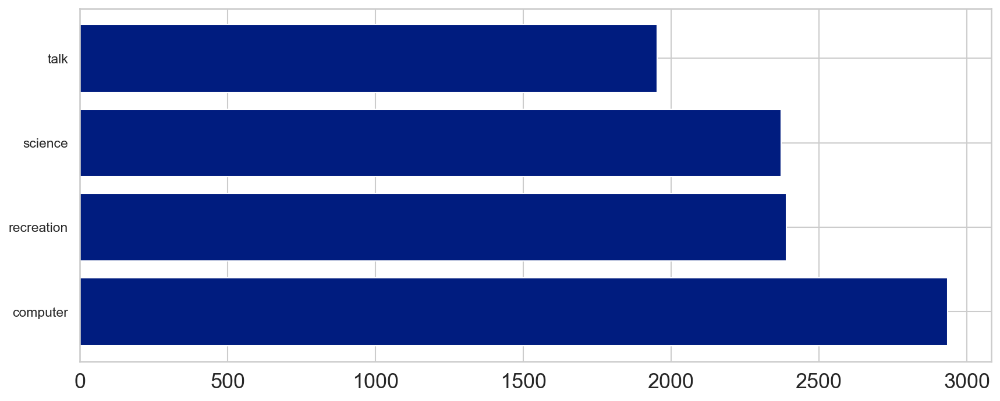

In [90]:
# plotting the count of documents per new category
plt.clf()
plt.figure(figsize=(12, 5))
category = list(new_count_per_category.keys())
count = list(new_count_per_category.values())
plt.barh(range(len(new_count_per_category)), count, tick_label=grouped_categories)
plt.show()

### ✏️ Observe the results above and discuss the following:
- Compare this new class distribution with the 17-category distribution we saw previously. Are the majority classes even more dominant? How might this affect classification performance?

Answer:
- The majority classes are more dominant in the new class distribution. This will make the model easier to classify this kind of data. Because the similar topics are grouped together. On the other hand, the minority class might reduce performance on recall. Because the model might have inbalance data distribution and make the meaningful boundaries.

### 3.1.2 Classification Performance

In [91]:
# initializing lists to track the training and testing accuracies
sub_category_train_accuracy = []
sub_category_test_accuracy = []

In [92]:
# initializing lists to track performance metrics
sub_precision_score = []
sub_recall_score = []
sub_f1_score = []

## 3.2 K-Nearest Neighbour Classifier


### 3.2.1 Training

In [93]:
# initializing and fitting the KNN Classifier
sub_knn_clf = KNeighborsClassifier(n_neighbors=4)
sub_knn_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=4)

### 3.2.2 Evaluation

In [94]:
# calculating training accuracy
sub_knn_train_prediction = sub_knn_clf.predict(X_train)
sub_knn_train_accuracy = accuracy_score(y_train,sub_knn_train_prediction)
print("Training Accuracy:", sub_knn_train_accuracy*100)
sub_category_train_accuracy.append(sub_knn_train_accuracy)

# calculating testing accuracy
sub_knn_test_prediction = sub_knn_clf.predict(X_test)
sub_knn_test_accuracy = accuracy_score(y_test, sub_knn_test_prediction)
print("Testing Accuracy:", sub_knn_test_accuracy*100)
sub_category_test_accuracy.append(sub_knn_test_accuracy)

Training Accuracy: 56.71502590673575
Testing Accuracy: 27.719844357976655


In [95]:
# creating the confusion matrix
sub_knn_conf_matrix = confusion_matrix(y_test, sub_knn_test_prediction)

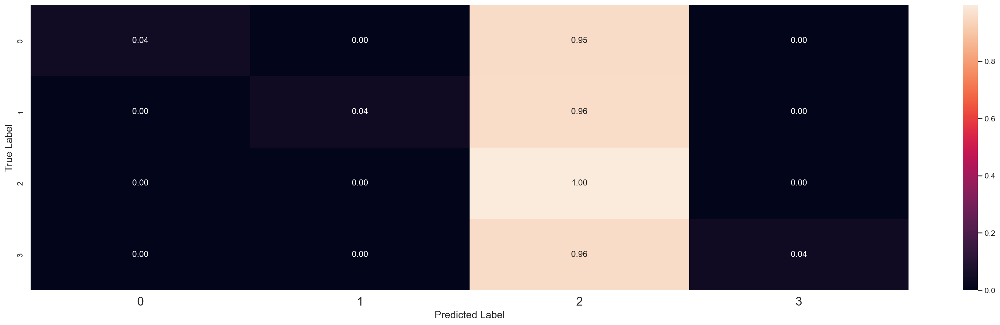

In [96]:
# normalising and viewing the confusion matrix
plt.clf()
sub_knn_conf_matrix_norm = sub_knn_conf_matrix.astype('float') / sub_knn_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_knn_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [97]:
# calculating metrics for the prediction
sub_knn_metrics = metrics.classification_report(y_test, sub_knn_test_prediction,target_names=grouped_categories)
print(sub_knn_metrics)

              precision    recall  f1-score   support

    computer       0.97      0.04      0.08      1955
  recreation       0.94      0.04      0.08      1590
     science       0.25      1.00      0.40      1579
        talk       0.96      0.04      0.08      1301

    accuracy                           0.28      6425
   macro avg       0.78      0.28      0.16      6425
weighted avg       0.78      0.28      0.16      6425



### 3.2.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [98]:
# initializing grid search cross validation for hyperparameter tuning
neighbour_values=[]
for i in range(1,15):
  neighbour_values.append(i)
weight_values=['uniform', 'distance']
leaf_values = [30,40,50,60]

sub_knn_parameters_dict = dict(n_neighbors=neighbour_values, weights=weight_values,leaf_size=leaf_values)
sub_knn_grid = GridSearchCV(sub_knn_clf, sub_knn_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
sub_knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=4), n_jobs=10,
             param_grid={'leaf_size': [30, 40, 50, 60],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [99]:
# viewing the best parameters
print(sub_knn_grid.best_params_)

{'leaf_size': 30, 'n_neighbors': 2, 'weights': 'distance'}


##### **Retraining**

In [100]:
# reinitializing and refitting the KNN Classifier
sub_knn_ht_clf = KNeighborsClassifier(n_neighbors=2,weights='distance',leaf_size=30)
sub_knn_ht_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=2, weights='distance')

##### **Revaluation**

In [101]:
# recalculating training accuracy
sub_knn_ht_train_prediction = sub_knn_ht_clf.predict(X_train)
sub_knn_ht_train_accuracy = accuracy_score(y_train,sub_knn_ht_train_prediction)
print("Training Accuracy with tuned Hyperparameters:",sub_knn_ht_train_accuracy*100)
sub_category_train_accuracy.append(sub_knn_ht_train_accuracy)

# recalculating testing accuracy
sub_knn_ht_test_prediction = sub_knn_ht_clf.predict(X_test)
sub_knn_ht_test_accuracy = accuracy_score(y_test, sub_knn_ht_test_prediction)
print("Testing Accuracy with tuned Hyperparameters:",sub_knn_ht_test_accuracy*100)
sub_category_test_accuracy.append(sub_knn_ht_test_accuracy)

Training Accuracy with tuned Hyperparameters: 97.83419689119171
Testing Accuracy with tuned Hyperparameters: 29.71206225680934


In [102]:
# creating the confusion matrix
sub_knn_ht_conf_matrix = confusion_matrix(y_test, sub_knn_ht_test_prediction)

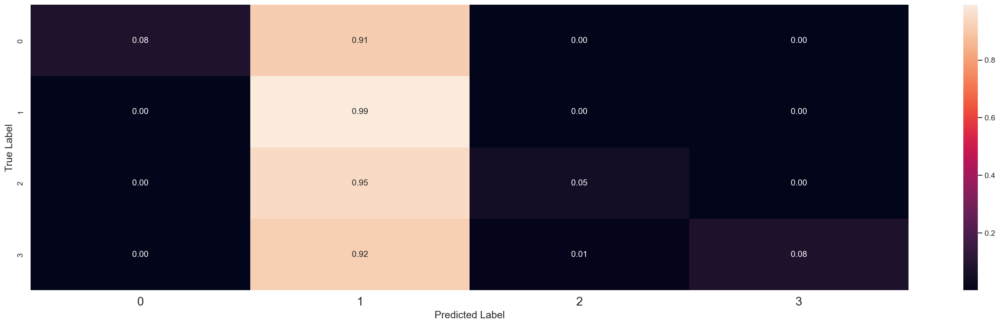

In [103]:
# renormalising and reviewing the confusion matrix
plt.clf()
sub_knn_ht_conf_matrix_norm = sub_knn_ht_conf_matrix.astype('float') / sub_knn_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_knn_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [104]:
# calculating metrics for the prediction
sub_knn_ht_metrics = metrics.classification_report(y_test, sub_knn_ht_test_prediction,target_names=grouped_categories)
print(sub_knn_ht_metrics)

              precision    recall  f1-score   support

    computer       0.95      0.08      0.15      1955
  recreation       0.26      0.99      0.41      1590
     science       0.74      0.05      0.09      1579
        talk       0.92      0.08      0.14      1301

    accuracy                           0.30      6425
   macro avg       0.72      0.30      0.20      6425
weighted avg       0.72      0.30      0.20      6425



## 3.3 Support Vector Machine Classifier

### 3.3.1 Training

In [105]:
# initializing and fitting the SVM classifier
sub_svm_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000)
sub_svm_clf.fit(X_train,y_train)

LinearSVC(dual=False)

### 3.3.2 Evaluation

In [106]:
# calculating training accuracy
sub_svm_train_prediction = sub_svm_clf.predict(X_train)
sub_svm_train_accuracy = accuracy_score(y_train,sub_svm_train_prediction)
print("Training Accuracy:",sub_svm_train_accuracy*100)
sub_category_train_accuracy.append(sub_svm_train_accuracy)

# calculating testing accuracy
sub_svm_test_prediction = sub_svm_clf.predict(X_test)
sub_svm_test_accuracy = accuracy_score(y_test, sub_svm_test_prediction)
print("Testing Accuracy:",sub_svm_test_accuracy*100)
sub_category_test_accuracy.append(sub_svm_test_accuracy)

Training Accuracy: 97.62694300518135
Testing Accuracy: 83.81322957198444


In [107]:
# creating the confusion matrix
sub_svm_conf_matrix = confusion_matrix(y_test, sub_svm_test_prediction)

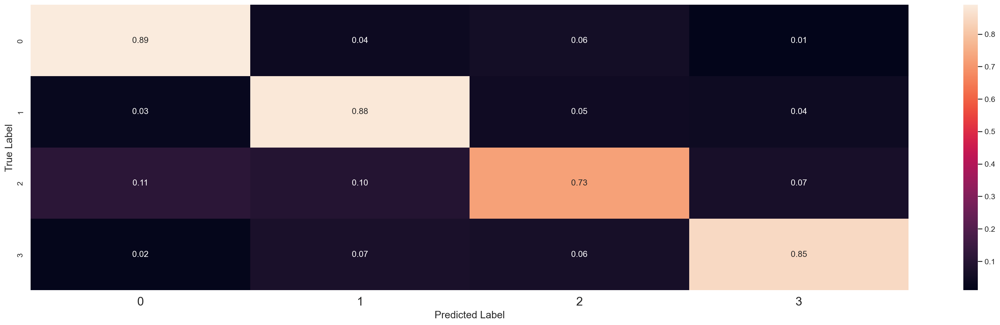

In [108]:
# normalizing and viewing the confusion matrix
plt.clf()
sub_svm_conf_matrix_norm = sub_svm_conf_matrix.astype('float') / sub_svm_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_svm_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [109]:
# calculating metrics for the prediction
sub_svm_metrics = metrics.classification_report(y_test, sub_svm_test_prediction,target_names=grouped_categories)
print(sub_svm_metrics)

              precision    recall  f1-score   support

    computer       0.87      0.89      0.88      1955
  recreation       0.81      0.88      0.84      1590
     science       0.81      0.73      0.77      1579
        talk       0.85      0.85      0.85      1301

    accuracy                           0.84      6425
   macro avg       0.84      0.84      0.83      6425
weighted avg       0.84      0.84      0.84      6425



### 3.3.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [110]:
# intializing grid search cross validation for hyperparameter tuning
penalty_values=['l1','l2']
tolerance_values = [0.1,0.001]
C_values=[2,5,10]
sub_svm_parameters_dict = dict(penalty=penalty_values, C=C_values, tol=tolerance_values)
sub_svm_grid = GridSearchCV(sub_svm_clf, sub_svm_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
sub_svm_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False), n_jobs=10,
             param_grid={'C': [2, 5, 10], 'penalty': ['l1', 'l2'],
                         'tol': [0.1, 0.001]},
             scoring='accuracy')

In [111]:
# viewing the best parameters
print(sub_svm_grid.best_params_)

{'C': 2, 'penalty': 'l2', 'tol': 0.1}


##### **Retraining**

In [112]:
# reinitializing and refitting the SVM classifier
sub_svm_ht_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000, C=2, tol=0.1)
sub_svm_ht_clf.fit(X_train,y_train)

LinearSVC(C=2, dual=False, tol=0.1)

##### **Revaluation**

In [113]:
# recalculating training accuracy
sub_svm_ht_train_prediction = sub_svm_ht_clf.predict(X_train)
sub_svm_ht_train_accuracy = accuracy_score(y_train,sub_svm_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",sub_svm_ht_train_accuracy*100)
sub_category_train_accuracy.append(sub_svm_ht_train_accuracy)

# recalculating testing accuracy
sub_svm_ht_test_prediction = sub_svm_ht_clf.predict(X_test)
sub_svm_ht_test_accuracy = accuracy_score(y_test, sub_svm_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",sub_svm_ht_test_accuracy*100)
sub_category_test_accuracy.append(sub_svm_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 96.69430051813471
Testing Accuracy with tuned hyperparameters: 83.93774319066148


In [114]:
# creating the confusion matrix
sub_svm_ht_conf_matrix = confusion_matrix(y_test, sub_svm_ht_test_prediction)

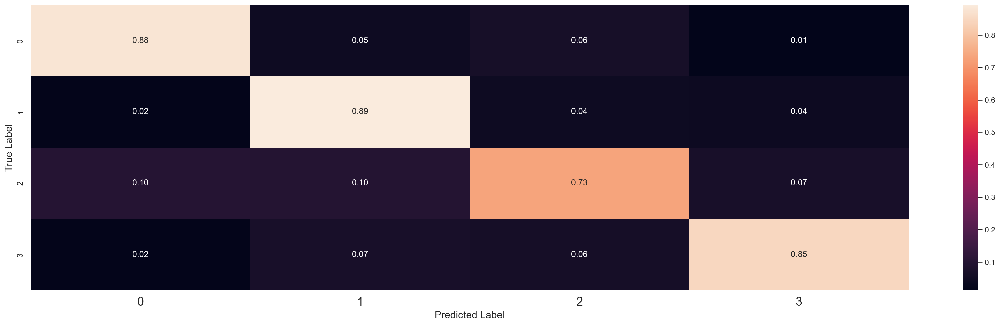

In [115]:
# renormalizing and reviewing the confusion matrix
plt.clf()
sub_svm_ht_conf_matrix_norm = sub_svm_ht_conf_matrix.astype('float') / sub_svm_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_svm_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [116]:
# calculating metrics for the prediction
sub_svm_ht_metrics = metrics.classification_report(y_test, sub_svm_ht_test_prediction, target_names=grouped_categories)
print(sub_svm_ht_metrics)

              precision    recall  f1-score   support

    computer       0.89      0.88      0.88      1955
  recreation       0.81      0.89      0.85      1590
     science       0.80      0.73      0.77      1579
        talk       0.84      0.85      0.84      1301

    accuracy                           0.84      6425
   macro avg       0.84      0.84      0.84      6425
weighted avg       0.84      0.84      0.84      6425



## 3.4 Multinomial Naive Bayes Classifier

### 3.4.1 Training

In [117]:
# initializing and fitting the Multinomial Naive Bayes Classifier
sub_mnb_clf = MultinomialNB(alpha=0.1)
sub_mnb_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.1)

### 3.4.2 Evaluation

In [118]:
# calculating training accuracy
sub_mnb_train_prediction = sub_mnb_clf.predict(X_train)
sub_mnb_train_accuracy = accuracy_score(y_train, sub_mnb_train_prediction)
print("Training Accuracy:",sub_mnb_train_accuracy*100)
sub_category_train_accuracy.append(sub_mnb_train_accuracy)

# calculating the testing accuracy 
sub_mnb_test_prediction = sub_mnb_clf.predict(X_test)
sub_mnb_test_accuracy= accuracy_score(y_test, sub_mnb_test_prediction)
print("Testing Accuracy:",sub_mnb_test_accuracy*100)
sub_category_test_accuracy.append(sub_mnb_test_accuracy)

Training Accuracy: 93.25388601036269
Testing Accuracy: 84.90272373540856


In [119]:
# creating the confusion matrix
sub_mnb_conf_matrix = confusion_matrix(y_test, sub_mnb_test_prediction)

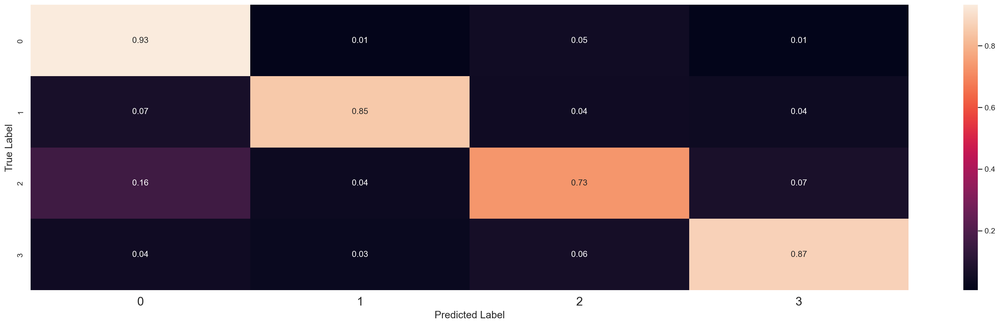

In [120]:
# normalising and viewing the confusion matrix
plt.clf()
sub_mnb_conf_matrix_norm = sub_mnb_conf_matrix.astype('float') / sub_mnb_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_mnb_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [121]:
# calculating metrics for the prediction
sub_mnb_metrics = metrics.classification_report(y_test, sub_mnb_test_prediction,target_names=grouped_categories)
print(sub_mnb_metrics)

              precision    recall  f1-score   support

    computer       0.81      0.93      0.87      1955
  recreation       0.92      0.85      0.88      1590
     science       0.83      0.73      0.78      1579
        talk       0.85      0.87      0.86      1301

    accuracy                           0.85      6425
   macro avg       0.85      0.84      0.85      6425
weighted avg       0.85      0.85      0.85      6425



### 3.4.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [122]:
# initializing Grid Search Cross Validation for hyperparameter tuning
alpha_range = [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5, 8, 9, 10]
fit_vals=[True,False]
sub_mnb_parameters_dict = dict(alpha=alpha_range,fit_prior=fit_vals)
sub_mnb_grid = GridSearchCV(sub_mnb_clf, sub_mnb_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
sub_mnb_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(alpha=0.1), n_jobs=10,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5,
                                   8, 9, 10],
                         'fit_prior': [True, False]},
             scoring='accuracy')

In [123]:
# viewing the best parameters
sub_mnb_grid.best_params_

{'alpha': 0.2, 'fit_prior': False}

##### **Retraining**

In [124]:
# reinitializing and refitting the Multinomial Naive Bayes Classifier
sub_mnb_ht_clf = MultinomialNB(alpha=0.2,fit_prior=False)
sub_mnb_ht_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.2, fit_prior=False)

##### **Revaluation**

In [125]:
# recalculating training accuracy
sub_mnb_ht_train_prediction = sub_mnb_ht_clf.predict(X_train)
sub_mnb_ht_train_accuracy = accuracy_score(y_train, sub_mnb_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",sub_mnb_ht_train_accuracy*100)
sub_category_train_accuracy.append(sub_mnb_ht_train_accuracy)

# recalculating testing accuracy
sub_mnb_ht_test_prediction = sub_mnb_ht_clf.predict(X_test)
sub_mnb_ht_test_accuracy= accuracy_score(y_test, sub_mnb_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",sub_mnb_ht_test_accuracy*100)
sub_category_test_accuracy.append(sub_mnb_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 92.860103626943
Testing Accuracy with tuned hyperparameters: 85.08949416342413


In [126]:
# creating the confusion matrix
sub_mnb_ht_conf_matrix = confusion_matrix(y_test, sub_mnb_ht_test_prediction)

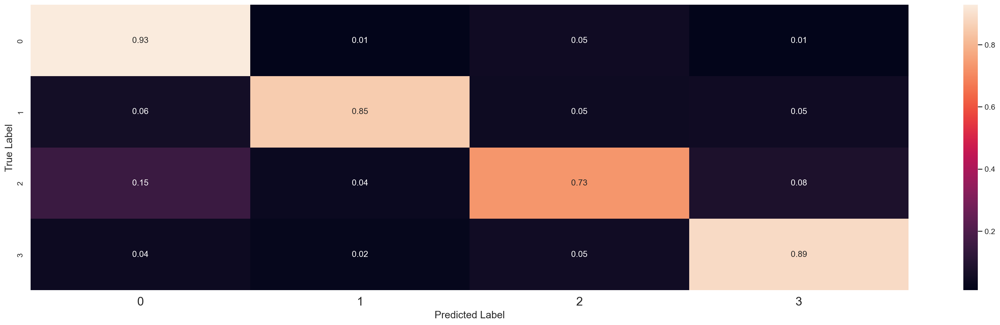

In [127]:
# renormalising and viewing the confusion matrix
plt.clf()
sub_mnb_ht_conf_matrix_norm = sub_mnb_ht_conf_matrix.astype('float') / sub_mnb_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_mnb_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [128]:
# recalculating metrics for the prediction
sub_mnb_ht_metrics = metrics.classification_report(y_test, sub_mnb_ht_test_prediction,target_names=grouped_categories)
print(sub_mnb_ht_metrics)

              precision    recall  f1-score   support

    computer       0.82      0.93      0.87      1955
  recreation       0.92      0.85      0.88      1590
     science       0.83      0.73      0.78      1579
        talk       0.84      0.89      0.86      1301

    accuracy                           0.85      6425
   macro avg       0.85      0.85      0.85      6425
weighted avg       0.85      0.85      0.85      6425



## 3.5 Logistic Regression

### 3.5.1 Training

In [129]:
# initializing and fitting the Logistic Regression Classifier
sub_lr_clf = LogisticRegression(multi_class='multinomial', solver='lbfgs')
sub_lr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial')

### 3.5.2 Evaluation

In [130]:
# calculating training accuracy
sub_lr_train_prediction = sub_lr_clf.predict(X_train)
sub_lr_train_accuracy = accuracy_score(y_train, sub_lr_train_prediction)
print("Training Accuracy:",sub_lr_train_accuracy*100)
sub_category_train_accuracy.append(sub_lr_train_accuracy)

# calculating the testing accuracy 
sub_lr_test_prediction = sub_lr_clf.predict(X_test)
sub_lr_test_accuracy= accuracy_score(y_test, sub_lr_test_prediction)
print("Testing Accuracy:",sub_lr_test_accuracy*100)
sub_category_test_accuracy.append(sub_lr_test_accuracy)

Training Accuracy: 94.65284974093264
Testing Accuracy: 84.0


In [131]:
# creating the confusion matrix
sub_lr_conf_matrix = confusion_matrix(y_test, sub_lr_test_prediction)

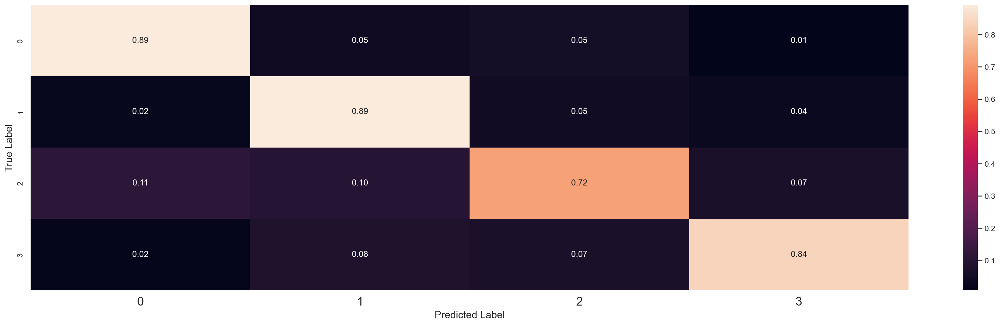

In [132]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
sub_lr_conf_matrix_norm = sub_lr_conf_matrix.astype('float') / sub_lr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_lr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

## 3.6 Logistic Regression (One-vs-all)

### 3.6.1 Training

In [133]:
# initializing and fitting the Logistic Regression Classifier
sub_lrovr_clf = LogisticRegression(multi_class='ovr')
sub_lrovr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='ovr')

### 3.6.2 Evaluation

In [134]:
# calculating training accuracy
sub_lrovr_train_prediction = sub_lrovr_clf.predict(X_train)
sub_lrovr_train_accuracy = accuracy_score(y_train, sub_lrovr_train_prediction)
print("Training Accuracy:",sub_lrovr_train_accuracy*100)
sub_category_train_accuracy.append(sub_lrovr_train_accuracy)

# calculating the testing accuracy 
sub_lrovr_test_prediction = sub_lrovr_clf.predict(X_test)
sub_lrovr_test_accuracy= accuracy_score(y_test, sub_lrovr_test_prediction)
print("Testing Accuracy:",sub_lrovr_test_accuracy*100)
sub_category_test_accuracy.append(sub_lrovr_test_accuracy)

Training Accuracy: 93.49222797927462
Testing Accuracy: 83.73540856031128


In [135]:
# creating the confusion matrix
sub_lrovr_conf_matrix = confusion_matrix(y_test, sub_lrovr_test_prediction)

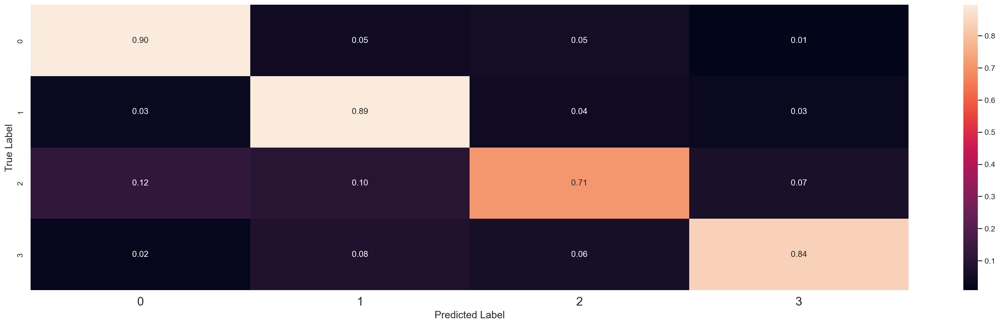

In [136]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
sub_lrovr_conf_matrix_norm = sub_lrovr_conf_matrix.astype('float') / sub_lrovr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_lrovr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

## 3.7 Performance Comparision

### 3.7.1 Accuray

In [137]:
# comparing training and testing accuracies
sub_model_acc_compare = pd.DataFrame({'Algorithm' : classification_models, 'Training_Accuracy' : sub_category_train_accuracy, 'Testing_Accuracy' : sub_category_test_accuracy})
sub_model_acc_compare.sort_values(by='Testing_Accuracy', ascending=False)

,Algorithm,Training_Accuracy,Testing_Accuracy
5,Multinomial Naive Bayes Hypertuned,0.928601,0.850895
4,Multinomial Naive Bayes,0.932539,0.849027
6,Logistic Regression Multiclass,0.946528,0.840000
3,Support Vector Machine Hypertuned,0.966943,0.839377
2,Support Vector Machine,0.976269,0.838132
7,Logistic Regression One-vs-all,0.934922,0.837354
1,K Nearest Neighbor Hypertuned,0.978342,0.297121
0,K Nearest Neighbor,0.567150,0.277198


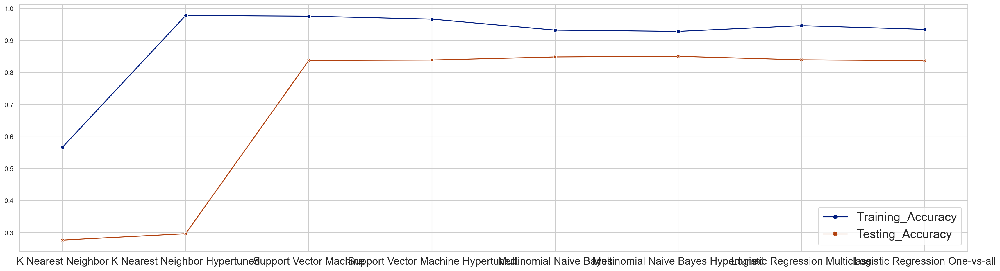

In [138]:
# visualizing the training and testing accuracies
plt.clf()
ax = sns.lineplot(data=[sub_model_acc_compare['Training_Accuracy'], sub_model_acc_compare['Testing_Accuracy']], dashes=False, markers=True)
ax.set_xticks(range(len(sub_model_acc_compare['Algorithm'])))
ax.set_xticklabels(sub_model_acc_compare['Algorithm'])
plt.show()

### ✏️ Observe the results above and discuss the following:
- Compare these new class results with the 17-category ones we saw previously. Does the overall performance improve? Why?
- Do models behave the same (e.g., overfitting and underfitting)?

Answer:
- The overall performance improved with the new class results. The model is easier to classify the data because the similar topics are grouped together. This makes the model easier to classify the data. Because the different topics are more different from each other. This can lead to a better performance on the testing accuracy.
- The models behave mostly the same. The KNN model is still overfitting. But we can find the naive bayes model have a even close score for the training and testing accuracy. This can indicate that the model is generalized well. The SVM and Logistic Regression model have a similar performance on the training and testing accuracy. This can indicate that the model is even performing generally well compared to the previous experiment.

### 3.7.2 Holistic Comparision

In [139]:
# calculating all the performance metrics
sub_precision_score.extend([metrics.precision_score(y_test, sub_knn_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_knn_ht_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_svm_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_svm_ht_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_mnb_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_mnb_ht_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_lr_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_lrovr_test_prediction,average="weighted")*100])

sub_recall_score.extend([metrics.recall_score(y_test, sub_knn_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_knn_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_svm_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_svm_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_mnb_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_mnb_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_lr_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_lrovr_test_prediction,average="weighted")*100])

sub_f1_score.extend([metrics.f1_score(y_test, sub_knn_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_knn_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_svm_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_svm_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_mnb_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_mnb_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_lr_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_lrovr_test_prediction,average="weighted")*100])

In [140]:
# displaying all the performance metrics
sub_comp_metric = pd.DataFrame({'Model' : classification_models,
                       'Precision' : sub_precision_score,
                       'Recall' : sub_recall_score,
                       'F1' : sub_f1_score,
                       'Test_Accuracy' : sub_category_test_accuracy},
                       index=["", "", "","","","","","4 Clubbed Groups"])

sub_comp_metric.sort_values(by='Test_Accuracy', ascending=False, inplace=True)
sub_comp_metric

,Model,Precision,Recall,F1,Test_Accuracy
,Multinomial Naive Bayes Hypertuned,85.283417,85.089494,84.961268,0.850895
,Multinomial Naive Bayes,85.120560,84.902724,84.783087,0.849027
,Logistic Regression Multiclass,84.005292,84.000000,83.886609,0.840000
,Support Vector Machine Hypertuned,83.962498,83.937743,83.856660,0.839377
,Support Vector Machine,83.778604,83.813230,83.701861,0.838132
4 Clubbed Groups,Logistic Regression One-vs-all,83.760739,83.735409,83.574919,0.837354
,K Nearest Neighbor Hypertuned,72.051484,29.712062,19.809754,0.297121
,K Nearest Neighbor,78.486367,27.719844,16.078762,0.277198


The above table shows metrics for the 4 clubbed groups. The detail comparison can be found in the **'Comparing Final Metrics'** section

# 4. Overview of Test Performance

## 4.1 Accuracy

In [141]:
# comparing the testing accuracies of the 4 clubbed groups and 17 individual groups
final_accuracy_compare = pd.DataFrame({'Algorithm' : classification_models, '17_Individual_Groups_Testing_Accuracy' : all_category_test_accuracy, '4_Clubbed_Groups_Testing_Accuracy' : sub_category_test_accuracy})
final_accuracy_compare.sort_values(by='4_Clubbed_Groups_Testing_Accuracy', ascending=False)

,Algorithm,17_Individual_Groups_Testing_Accuracy,4_Clubbed_Groups_Testing_Accuracy
5,Multinomial Naive Bayes Hypertuned,0.717354,0.850895
4,Multinomial Naive Bayes,0.715642,0.849027
6,Logistic Regression Multiclass,0.705837,0.840000
3,Support Vector Machine Hypertuned,0.701012,0.839377
2,Support Vector Machine,0.698988,0.838132
7,Logistic Regression One-vs-all,0.705681,0.837354
1,K Nearest Neighbor Hypertuned,0.120156,0.297121
0,K Nearest Neighbor,0.108327,0.277198


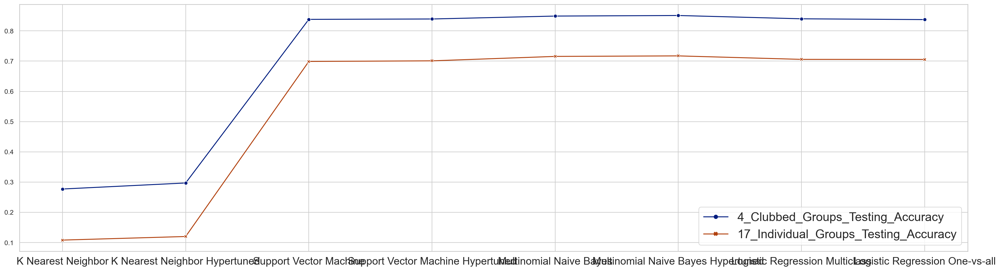

In [142]:
# visualizing the testing accuracies of the 4 clubbed groups and 17 individual groups
plt.clf()
ax = sns.lineplot(data=[final_accuracy_compare['4_Clubbed_Groups_Testing_Accuracy'], final_accuracy_compare['17_Individual_Groups_Testing_Accuracy']], dashes=False, markers=True)
ax.set_xticks(range(len(final_accuracy_compare['Algorithm'])))
ax.set_xticklabels(final_accuracy_compare['Algorithm'])
plt.show()

## 4.2 Holistic Performance

In [143]:
# comparing the performance metrics of the 4 clubbed groups and 17 individual groups
final_metric_compare = pd.concat([sub_comp_metric, all_comp_metric])
final_metric_compare

,Model,Precision,Recall,F1,Test_Accuracy
,Multinomial Naive Bayes Hypertuned,85.283417,85.089494,84.961268,0.850895
,Multinomial Naive Bayes,85.120560,84.902724,84.783087,0.849027
,Logistic Regression Multiclass,84.005292,84.000000,83.886609,0.840000
,Support Vector Machine Hypertuned,83.962498,83.937743,83.856660,0.839377
,Support Vector Machine,83.778604,83.813230,83.701861,0.838132
4 Clubbed Groups,Logistic Regression One-vs-all,83.760739,83.735409,83.574919,0.837354
,K Nearest Neighbor Hypertuned,72.051484,29.712062,19.809754,0.297121
,K Nearest Neighbor,78.486367,27.719844,16.078762,0.277198
,Multinomial Naive Bayes Hypertuned,73.244124,71.735409,72.097104,0.717354
,Multinomial Naive Bayes,72.279256,71.564202,71.485143,0.715642


### ✏️ Observe the results above and discuss the following:
- Which classifier showed the highest improvement in accuracy when switching from 17 individual groups to 4 clubbed groups? Why do you think this happened?
- The logistic regression classifiers (multiclass and one-vs-all) show similar performance with both group setups. What might explain this behavior?
- How does reducing the number of groups (from 17 to 4) impact the classifier's ability to generalize? Discuss how this might affect its performance in real-world applications.
- In a real-world scenario, would you prefer a model trained with 17 individual groups or 4 clubbed groups? Justify your choice based on performance and potential use cases.

Answer:
- From the result, it show that the KNN is likely to have the highest improvement in accuracy when switching from 17 individual groups to 4 clubbed groups. As delta close to 17. I think this mostly because the KNN model is more sensitive to the curse of dimensionality. By reducing the number of groups, the variance of the groups are smoother. This can lead to a better performance on the KNN model.
- They both benefit from the same reduction in task complexity and class overlap. The one-for-all model mostly decomposes the multiclass problem into binary tasks, and the similar performance can be explained by the fact that the broader groups do not have additional complexity in the classification task.
- When we only need to ensure the topic category, the 4 clubbed groups can be a better choice. Because the model is easier to classify the data. And with better performance. But when we need a more specific topic category, like to know what the customer might want to buy. The 17 individual groups will need to be chosen. Because the model can provide more specific information about the topic. This can lead to a better personalized recommendation.

# 5. ✏️ Additional Analyses on Classification

## 5.1 Word2Vec Results
Show the performance of 20 Newsgroups classification using Word2Vec embeddings as document features. Compare the results with those obtained using TF-IDF features.

In [ ]:
# TODO: Word2Vec fitting and evaluation

## 5.2 Cross-validation Results

The experiments we have conducted so far are based on a fixed train-test split. Such a setting might be problematic under certain circumstances, and cross-validation is often introduced to address this limitation.

- What is the main limitation of a fixed train-test split?  
- Use the cross-validation package provided by scikit-learn to show the classification results of a hyper-tuned Multinomial Naive Bayes model under a 10-fold cross-validation setting. What do you observe from the results?

Answer:
- Question 1:
    - The main limitation of a fixed train-test split is that the model is limited to the data that is used for training and testing. For a more dynamic topic like technology, there might come up with some new words that the model has never seen before. This can lead to a lack of performance on the model. In the other hand, if the dataset has bias distribution, the model might have a bias result. This will hurt the model performance on specific domain.


In [ ]:
# TODO: Cross-validation

- Question 2:
    - TODO: Write the observation from the results

# 6. Clustering

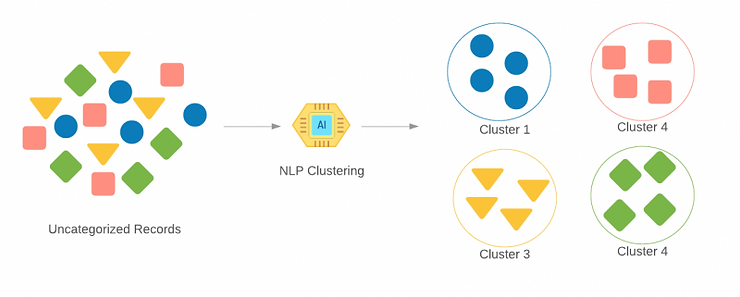
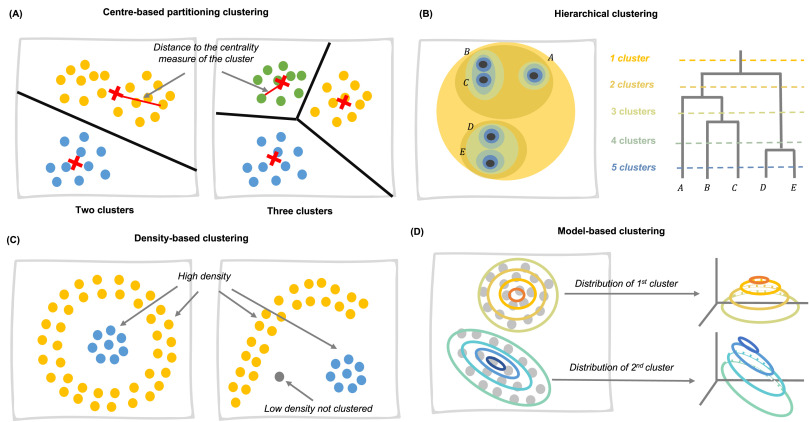

## 6.1 K-Means Clustering

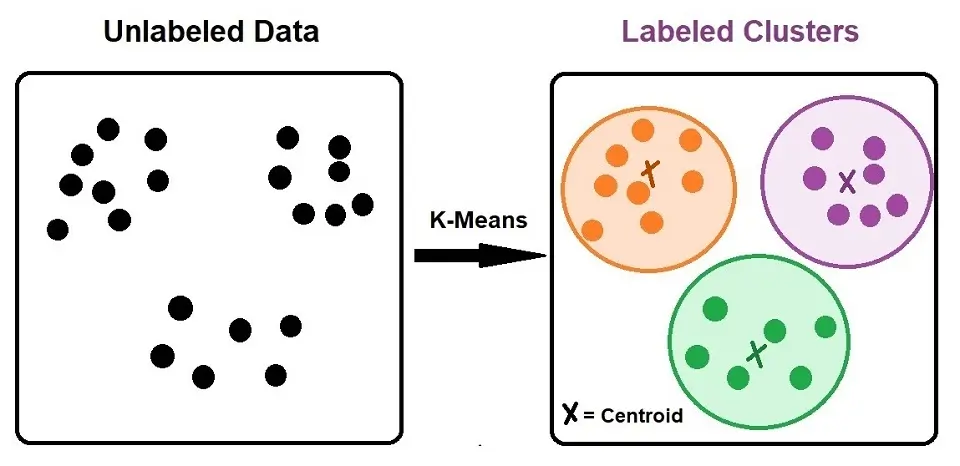
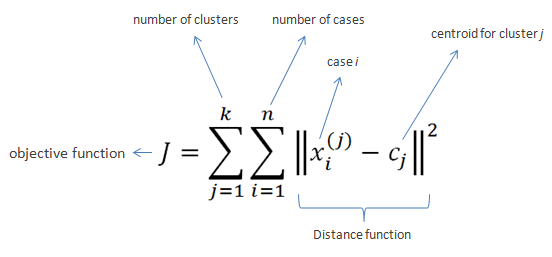


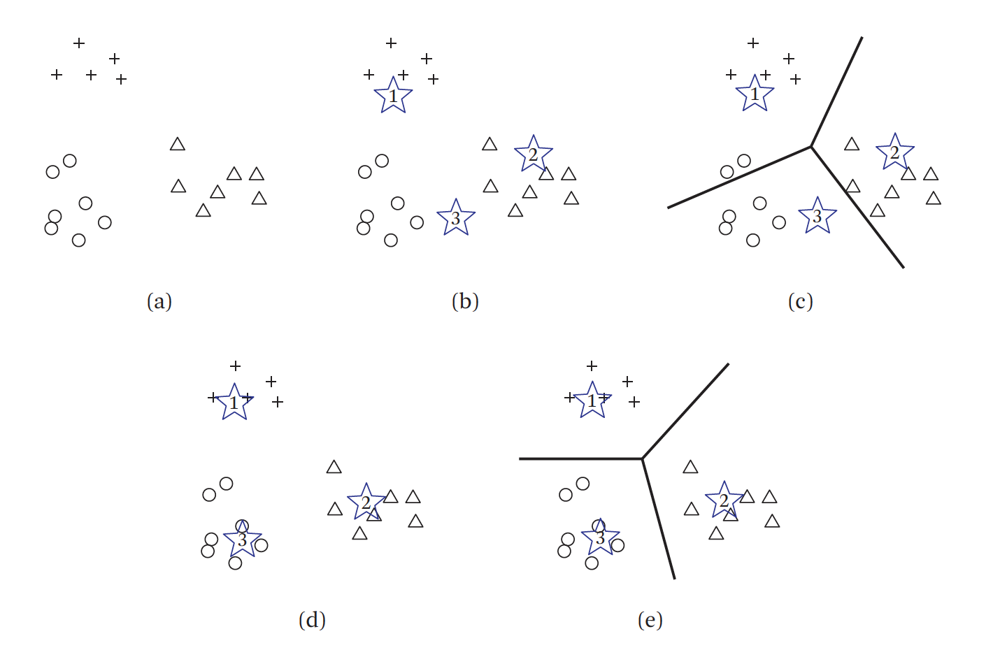
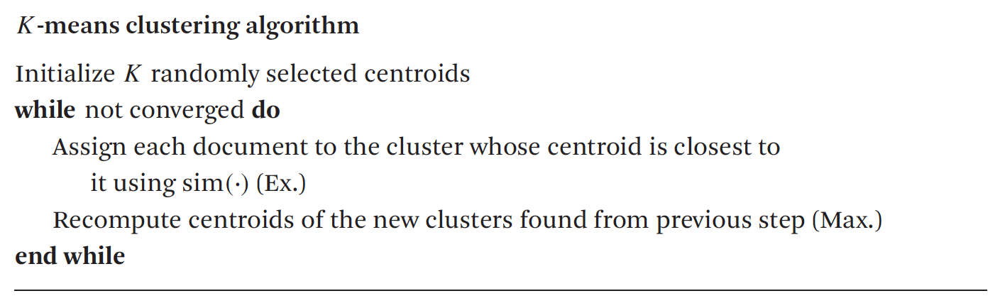

**This iteractive process is called an Expectation Maximixation process**
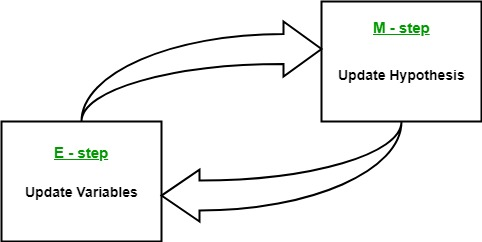

### 6.1.1 Determining k - Elbow Method

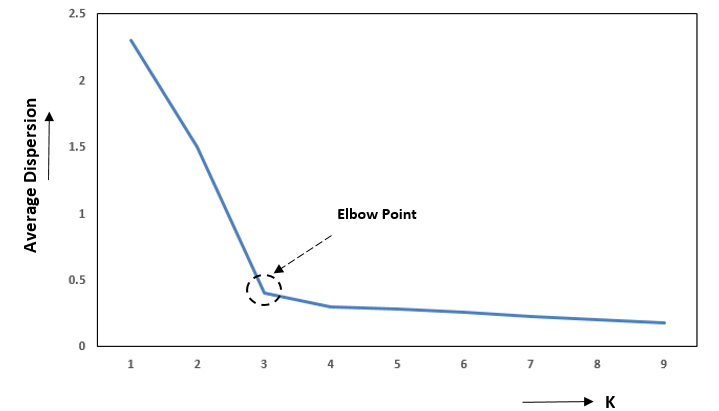

The intertia formula:</br>
$\sum_{i=1}^N(x_i-C_k)^2$, where $x_i$ is a document of class $k$, and $C_k$ is the center of cluster $k$.

In [144]:
# calculating inertia to determine the optimal value of k i.e. number of clusters
inertia = []
for k in range(1,20):
   kmeans = KMeans(n_clusters=k, max_iter=300, n_init=10)
   kmeans = kmeans.fit(X_train)
   inertia.append(kmeans.inertia_)

<Figure size 3750x1050 with 0 Axes>

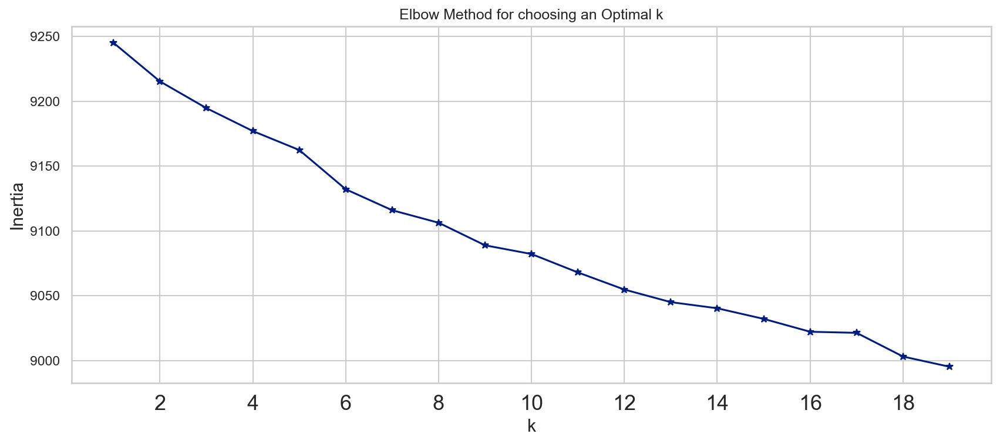

In [145]:
# plotting the results to get the elbow point
plt.clf()
plt.figure(figsize=(12, 5))
plt.plot(range(1,20), inertia, '*-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method for choosing an Optimal k')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.show()

### ✏️ Observe the results above and discuss the following:
- Unfortunately, there is no clear $k$ that forms an elbow. This might be due to the fact that the feature space is very high-dimensional. Try to represent the documents using 128-dimensional word2vec embeddings and see if you observe a clearer elbow.:

In [146]:
# We will just use the number of categories as the k here
chosen_k = 4

In [ ]:
# TODO: Repeat the inertia calculation with 128-dimensional word2vec embeddings

### 6.1.2 Applying K-Means Algorithm

In [147]:
# initializing kmeans with chosen_k centroids
kmeans = KMeans(n_clusters=chosen_k, init='k-means++', max_iter=200, n_init=10)

# fitting the model to the training data
kmeans.fit(X_train)

KMeans(max_iter=200, n_clusters=4, n_init=10)

In [148]:
# storing the cluster labels
cluster_label = kmeans.labels_

In [149]:
# viewing the cluster labels
cluster_label

array([0, 2, 3, ..., 0, 2, 2])

## 6.2 Analysis

Unlike classification, in the problem setting for clustering, we do not have labels for each document. As a result, evaluation metrics such as accuracy, precision, and recall are no longer applicable. Instead, we will use qualitative analysis to evaluate how the model performs.

### 6.2.1 Dimension Reduction with Principal Component Analysis (PCA)

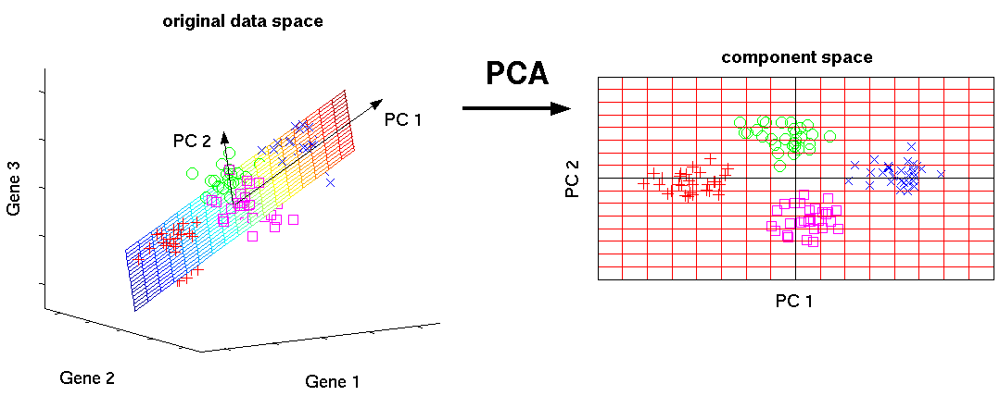

In [150]:
# viewing the shape of the training data
X_train.shape

(9650, 14798)

In [151]:
# initializing PCA with 2 components
pca = PCA(n_components=2, random_state=42)

# reducing the dimensionality
component_vectors = pca.fit_transform(X_train.toarray())

In [152]:
# viewing the component vectors
component_vectors

array([[-0.10248158, -0.07648162],
       [-0.02988199, -0.02329773],
       [ 0.03859736, -0.03686536],
       ...,
       [-0.08154973, -0.07743482],
       [-0.05135026,  0.02550783],
       [-0.03210275,  0.36567149]])

In [153]:
# storing the two dimensions
dimension_one = component_vectors[:, 0]
dimension_two = component_vectors[:, 1]

In [154]:
# creating a new dataframe with details of allotted cluster and new dimensions
df_dimension_reduced_cluster = pd.DataFrame({'post' : X_train_data['post'], 'preprocessed_post' : X_train_data['preprocessed_post'], 'dimension_one' : dimension_one, 'dimension_two' : dimension_two, 'cluster_label' : cluster_label})

In [155]:
# viewing the new dimensionaly reduced clustered dataframe
df_dimension_reduced_cluster

,post,preprocessed_post,dimension_one,dimension_two,cluster_label
0,"\n\nThere were many injustices in the middle ages. And this is truely sad.\nI would hate to see a day when churches put people to death or torchured\nthem for practicing homosexuality, or any other crime. The church is not\ncalled to take over the governments of the world. It may be that homosexuals\ntreated cruelly today, but that does not mean that we should teach \nChristians to practice homosexual immorality. Do you think that we should\nalso teach Christians to practice divination and channelling because\nthe witches in the middle ages were persecuted.\n\n\n\nAnd you accuse me of judging? When did you look into my heart and see\nif I have love. I have been writing that we should not teach Christians\nto practice homosexual immorality, and you pretend to have divine knowledge\nto look into my heart. I can't say that I love homosexuals as I should-\nI can't say that I love my neighbor as I should either. I don't know\nvery many homosexuals as it is. \n\nBut Jesus loves homosexuals, just as He loves everyone else. If His love\nwere conditional, I not know Him at all. Yes. We should show love to \nhomosexuals, but it is not love to encourage brothers in the church to \nstumble and continue in their sin. That is a very damaging and dangerous \nthing.\n\n\nThat is slander. I could just as easily say that NAMBLA has been able\nto implement legislation to make child molesting easier because of\nthe tearing down of societies morality due to people accepting homosexuality\nas normal, and that this is what you are embracing. I do believe\nthat homosexual sex is immoral, that does not mean I endorse using violence\nagainst them. There is a problem of hatred in the church. But there\nis also the problem of what has been called ""unsanctified mercy.""\nMany in the conservative churches have seen the moral breakdown in \nthis country and the storm on the horizon, and have gotten militant in \nthe flesh. This is truely sad. Yet others in other churches have \nembraced immorality in society, and have pointed to the carnality in the\nconservative churches to justify their actions. \n\n\nCertainly we should not use a bullwhip to drive people from Jesus.\nBut we shouldn't water down the gospel to draw people in. Jesus didn't\ngo out of His way to show only what might be considered positive aspects\nto draw people in. He told one man to sell all He had. He told\nanother not to say good bye to His family. His words were hard at times.\nWe should present people with the cost of the tower before we allow them\nto begin construction. many people have already been innoculated to the\ngospel.\n\nLink Hudson.\n\n\n",many injustices middle ages truely sad would hate see day churches put people death torchured practicing homosexuality crime church called take governments world may homosexuals treated cruelly today mean teach christians practice homosexual immorality think also teach christians practice divination channelling witches middle ages persecuted accuse judging look heart see love writing teach christians practice homosexual immorality pretend divine knowledge look heart say love homosexuals say love neighbor either know many homosexuals jesus loves homosexuals loves everyone else love conditional know yes show love homosexuals love encourage brothers church stumble continue sin damaging dangerous thing slander could easily say nambla able implement legislation make child molesting easier tearing societies morality due people accepting homosexuality normal embracing believe homosexual sex immoral mean endorse using violence problem hatred church also problem called unsanctified mercy many conservative churches seen moral breakdown country storm horizon gotten militant flesh truely sad yet others churches embraced immorality society pointed carnality conservative churches justify actions certainly use bullwhip drive people jesus water gospel draw people jesus go way show migh

### 6.2.2 Understanding Each Cluster

In [156]:
number_of_terms = 23

# grouping the tf-idf vector by cluster label
df_cluster_group = pd.DataFrame(X_train.todense()).groupby(cluster_label).mean()

# accessing terms of tf-idf vector
terms = vectorizer.get_feature_names_out() 
for i,r in df_cluster_group.iterrows():
  print(f'\nCluster {i}')
  print(', '.join([terms[t] for t in np.argsort(r)[-number_of_terms:]]))


Cluster 0
encryption, time, israel, many, see, say, make, gun, well, law, could, right, even, know, us, get, like, key, think, government, one, would, people

Cluster 1
time, like, first, player, go, one, nhl, baseball, good, win, would, think, teams, league, last, play, hockey, season, players, games, year, team, game

Cluster 2
something, two, want, see, com, may, could, much, well, anyone, new, time, also, car, use, good, think, know, edu, get, like, would, one

Cluster 3
mb, like, one, system, hi, program, files, problem, advance, help, get, dos, mail, file, use, would, drive, card, please, know, anyone, windows, thanks


In [157]:
# mapping clusters to the appropriate categories 
cluster_map = {0: "Talk", 1: "Computer", 2: "Sports", 3: 'Politics'}

# applying mappping to create a new column that stores the category to which the document belongs
df_dimension_reduced_cluster['cluster'] = df_dimension_reduced_cluster['cluster_label'].map(cluster_map)

In [158]:
# viewing the newly added column i.e. cluster to see the category of each document
df_dimension_reduced_cluster

,post,preprocessed_post,dimension_one,dimension_two,cluster_label,cluster
0,"\n\nThere were many injustices in the middle ages. And this is truely sad.\nI would hate to see a day when churches put people to death or torchured\nthem for practicing homosexuality, or any other crime. The church is not\ncalled to take over the governments of the world. It may be that homosexuals\ntreated cruelly today, but that does not mean that we should teach \nChristians to practice homosexual immorality. Do you think that we should\nalso teach Christians to practice divination and channelling because\nthe witches in the middle ages were persecuted.\n\n\n\nAnd you accuse me of judging? When did you look into my heart and see\nif I have love. I have been writing that we should not teach Christians\nto practice homosexual immorality, and you pretend to have divine knowledge\nto look into my heart. I can't say that I love homosexuals as I should-\nI can't say that I love my neighbor as I should either. I don't know\nvery many homosexuals as it is. \n\nBut Jesus loves homosexuals, just as He loves everyone else. If His love\nwere conditional, I not know Him at all. Yes. We should show love to \nhomosexuals, but it is not love to encourage brothers in the church to \nstumble and continue in their sin. That is a very damaging and dangerous \nthing.\n\n\nThat is slander. I could just as easily say that NAMBLA has been able\nto implement legislation to make child molesting easier because of\nthe tearing down of societies morality due to people accepting homosexuality\nas normal, and that this is what you are embracing. I do believe\nthat homosexual sex is immoral, that does not mean I endorse using violence\nagainst them. There is a problem of hatred in the church. But there\nis also the problem of what has been called ""unsanctified mercy.""\nMany in the conservative churches have seen the moral breakdown in \nthis country and the storm on the horizon, and have gotten militant in \nthe flesh. This is truely sad. Yet others in other churches have \nembraced immorality in society, and have pointed to the carnality in the\nconservative churches to justify their actions. \n\n\nCertainly we should not use a bullwhip to drive people from Jesus.\nBut we shouldn't water down the gospel to draw people in. Jesus didn't\ngo out of His way to show only what might be considered positive aspects\nto draw people in. He told one man to sell all He had. He told\nanother not to say good bye to His family. His words were hard at times.\nWe should present people with the cost of the tower before we allow them\nto begin construction. many people have already been innoculated to the\ngospel.\n\nLink Hudson.\n\n\n",many injustices middle ages truely sad would hate see day churches put people death torchured practicing homosexuality crime church called take governments world may homosexuals treated cruelly today mean teach christians practice homosexual immorality think also teach christians practice divination channelling witches middle ages persecuted accuse judging look heart see love writing teach christians practice homosexual immorality pretend divine knowledge look heart say love homosexuals say love neighbor either know many homosexuals jesus loves homosexuals loves everyone else love conditional know yes show love homosexuals love encourage brothers church stumble continue sin damaging dangerous thing slander could easily say nambla able implement legislation make child molesting easier tearing societies morality due people accepting homosexuality normal embracing believe homosexual sex immoral mean endorse using violence problem hatred church also problem called unsanctified mercy many conservative churches seen moral breakdown country storm horizon gotten militant flesh truely sad yet others churches embraced immorality society pointed carnality conservative churches justify actions certainly use bullwhip drive people jesus water gospel draw people jesus go way s

### 6.2.3 Visualization

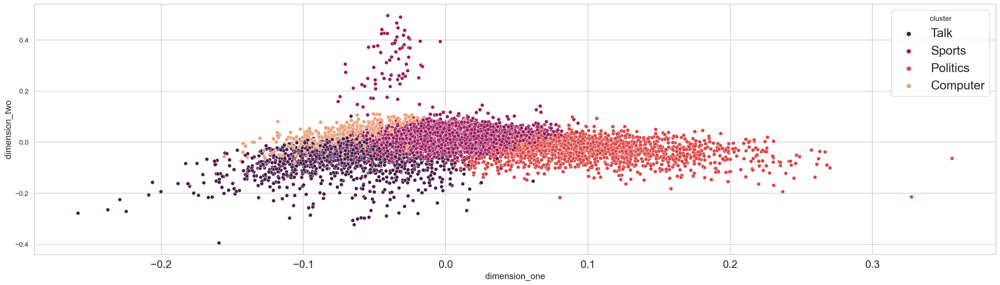

In [159]:
# visualizing the clusters formed after kmeans and pca
plt.clf()
sns.scatterplot(data=df_dimension_reduced_cluster, x='dimension_one', y='dimension_two', hue='cluster', palette="rocket")
plt.show()

### ✏️ Observe the results above and discuss the following:
- Which cluster appears to have the most overlap with other clusters, and why might this be the case?
- Why do you think certain words, like "good" and "think," appear in multiple clusters? How could the presence of overlapping terms impact the interpretation of the clusters?
- Why might some clusters have more generic terms (e.g., "space," "see," "may") while others are more domain-specific (e.g., "player," "team")?
- How might these clustering results be applied in a real-world scenario, such as topic summarization or information retrieval?
- What methods could you use to quantitatively evaluate the quality of these clusters?

Answer:
- The "Talk" cluster appears to have the most overlap with other clusters. This might be because the "Talk" cluster contains more general words that can be found in other clusters. This also might because it might overlap with some similar topics.
- The words like "good" and "think" appear in multiple clusters because they are general words that can be used in any topic. The presence of overlapping terms can impact the interpretation of the clusters because it can lead to a misinterpretation of the topic. So it might hurt the model performance on the topic classification.
- The clusters have more generic terms might due to the topic contain more widely discussed words, this might happen it "talk" topic. The domain-specific terms might due to the topic contain more specific words that can only be found in the topic. The domain-specific terms can help cluster the topic more accurately.
- When a user searches for a specific topic, the key word of the domain-specific terms can help the user to find the topic more accurately. If the user search query matches the domain-specific terms, we can tell that the user have more interest in the topic. Also, we can use this in recommendation system to recommend the topic that the user might like. By finding the user browsing history and cluster the topic and recommend the topic that close to the user history.
- For the quantitative evaluation, we can use the Silhouette score, Davies-Bouldin score, or Calinski-Harabasz score to evaluate the quality of the clusters. This can help us to know how well the model is performing on the clustering task. These score can help us to know how similar data points are within a cluster, and ratio of intra-cluster dispersion to inter-cluster separation etc.

### 6.2.4 Word Cloud

Cluster Label: 0 Cluster Name: Talk


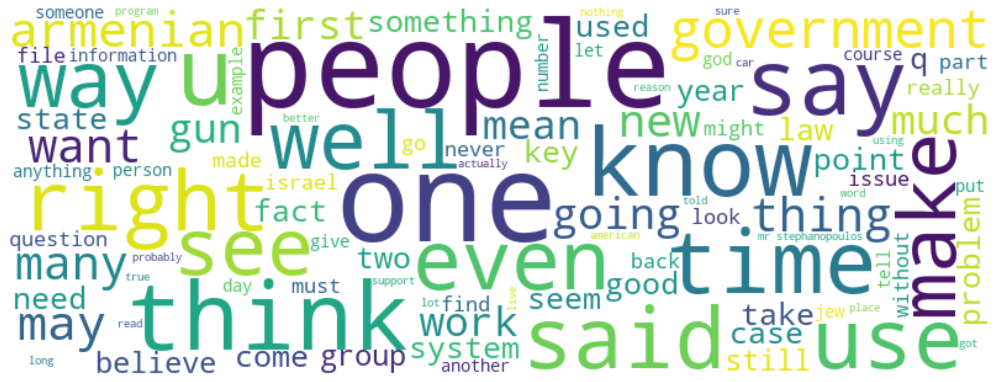

Cluster Label: 1 Cluster Name: Computer


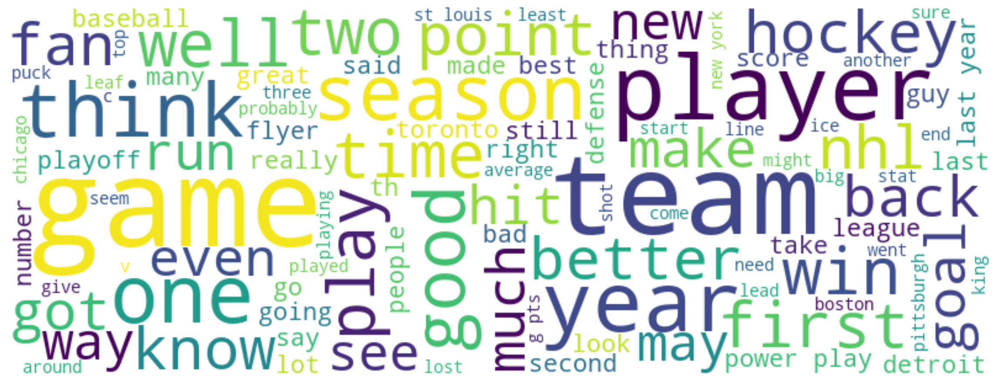

Cluster Label: 2 Cluster Name: Sports


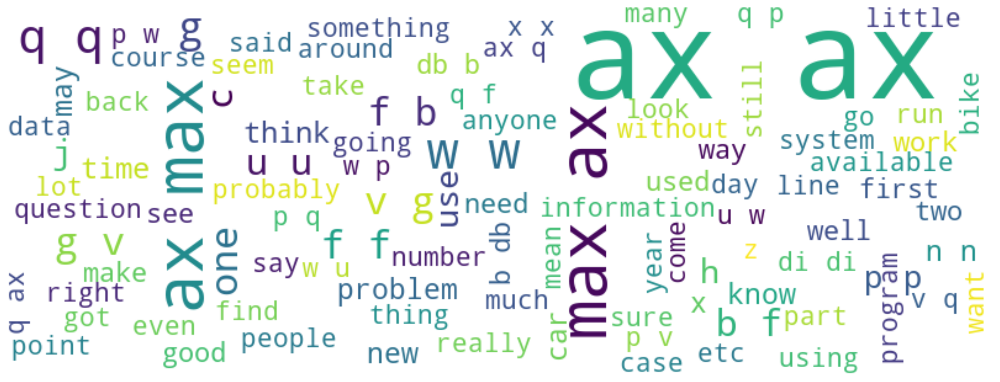

Cluster Label: 3 Cluster Name: Politics


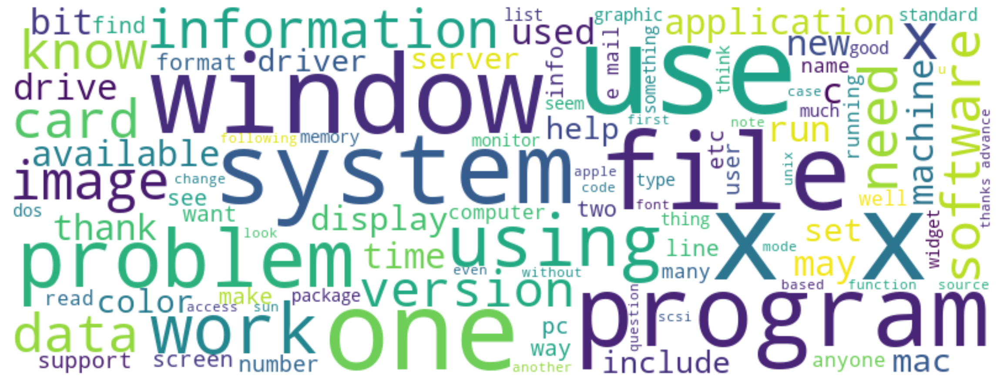

In [160]:
# viewing the wordcloud for each of the clusters
for k in range(0,chosen_k):
   df_matched_clusters=df_dimension_reduced_cluster[df_dimension_reduced_cluster['cluster_label']==k]
   text=df_matched_clusters['preprocessed_post'].str.cat(sep=' ')
   text=text.lower()
   text=' '.join([word for word in text.split()])
   wordcloud = WordCloud(width=800, height=300, max_font_size=100, max_words=100, background_color="white").generate(text)
   print(f'Cluster Label: {k} Cluster Name: {cluster_map[k]}')
   plt.figure()
   plt.imshow(wordcloud, interpolation="bilinear")
   plt.axis("off")
   plt.show()

The word cloud is created and visualized for each of the clusters. The words which are appearing repeatedly are big in size and the occurrence or importance of the word is directly proportional to the size of the word.

# Assignment 3

## 1. Discussion Questions
Answer the discussion questions above (those with ✏️ icon). Feel free to discuss and share your thoughts with your classmates.

## 2. Classification and Clustering Using Fine-tuned BERT
We previously explored fine-tuning a pre-trained BERT model for a text retrieval task in past lab exercises. Now, let’s take the next step and fine-tune BERT for a classification task.
- Fine-tune a Pre-trained BERT for Classification using the 20 Newsgroups Dataset:
  - Split the dataset into training, validation, and testing sets. Clearly explain the role of each dataset in the learning process.
- Analyze the Classification Results:
  - Perform both quantitative and qualitative analyses.
  - Quantitative Analysis: Plot a table comparing the classification results across different classifiers, including those covered in previous lab exercises.
  - Qualitative Analysis: Use methods such as attention score visualization, error analysis, or other approaches to provide insights into the model's performance.

In [ ]:
# TODO: Write the code here

## Bonus: Reproducing MIST for Short Text Clustering
The paper [MIST: Mutual Information Maximization for Short Text Clustering](https://aclanthology.org/2024.acl-long.610/) introduces a method to fine-tune a pre-trained BERT model by jointly optimizing a clustering loss and two representation learning losses. The authors have shared their source code on [GitHub](https://github.com/c4n/clustering_mist/). However, the source code is unorganized, and no documentation is provided.

Your task is to visit the GitHub repository and compile a Colab notebook to replicate the experiments using the **SearchSnippets** dataset. If the dataset is too large for your Colab account, you may use the **AgNews** dataset or a subset of the original dataset.

**Note:** You are **not required to write your own code from scratch** for this assignment. Instead, focus on understanding and organizing the provided code. The main challenge is to make the provided code functional. This includes:
- Fixing any errors or dependencies required to run the code.
- Organizing the unstructured code into a clear and runnable sequence in the Colab notebook.
- Adapting the code to work with the chosen dataset (e.g., SearchSnippets, AgNews, or a subset).

Once you successfully run the code, present the results in the Colab notebook, including:
- ACC and NMI on the target dataset, as reported by the authors in Table 1.



## 💻 Assignment Submission 💻
Write your responses to the discussion questions in this Jupyter Notebook. For assignment questions 2 and 3, create a Colab notebook and complete your work on it. Then, export these two notebooks as HTML files and submit both the Jupyter Notebooks and the HTML files to Cyber University. </br>
**Please ensure that the code is executed and the outputs are visible when exporting the HTML file.**